# Условие

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Нам предстоит построить модель, которая предскажет температуру стали.

##  Описание этапа обработки стали

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

## Описание данных

Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.

# Задача

## Промежуточные:

Для каждого значения столбца key найдите:

- Длительность времени между первым и последним замером температуры.
- Суммарное время нагрева электродами, то есть сумму значений по всем промежуткам между запусками нагрева электродов.
- Количество запусков нагрева электродами.
- Среднее соотношение потребления активной и реактивной мощности.

По всем полученным столбцам вычислите статистики: средние, минимальные и максимальные значения, медиану и величины 25%- и 75%-квартилей.

## Главная: 

Предсказать финальную температуру в процессе выплавления, чтобы не перегревать сталь и не расходовать излишнее электричество.

# Первичный анализ данных

Для написания грамотного и полного плана проекта нам требуется провести первичный анализ имеющихся данных. Импортируем библиотеку pandas и перейдем к загрузке массивов.

In [3]:
import pandas as pd

Начнем с таблицы data_arc.csv - данные об электродах.

In [4]:
data_arc = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_arc.csv')
#data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv')
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


In [5]:
data_arc.head(15)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


В таблице 5 столбцов и 14876 строк. В первую очередь нам потрбуется изменить тип данных в столбцах "Начало нагрева дугой" и "Конец нагрева дугой" - привести к datetime. Далее проверить на дубликаты, пропуски и какие-либо аномалии. После этого табличка готова к анализу.

Перейдем к таблице data_bulk.csv - данные о подаче сыпучих материалов (объём).

In [6]:
data_bulk = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_bulk.csv')
#data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')

data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [7]:
data_bulk.head(15)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


В таблице 16 столбцов и 3129 строк. Одна строка отвечает за одну партию, а каждый столбец bulk отвечает за какую-то одну примесь - добавляли ее в эту партию или нет. Поэтому в таблице так много пропусков, которые стоит заполнить нулями. После этого проверить на дубликаты или аномалии и перейти к следующей таблице.

Таблица data_bulk_time

In [8]:
data_bulk_time = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_bulk_time.csv')
#data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv')


data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


In [9]:
data_bulk_time.head(15)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56
5,6,NaN,NaN,NaN,2019-05-03 13:59:24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:53:27,NaN,2019-05-03 13:53:27,2019-05-03 13:53:27
6,7,NaN,NaN,NaN,2019-05-03 14:29:14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:22:19,NaN,2019-05-03 14:22:19,2019-05-03 14:22:19
7,8,NaN,NaN,NaN,2019-05-03 15:04:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 14:55:46,NaN,2019-05-03 14:55:46,2019-05-03 14:55:46
8,9,NaN,NaN,NaN,2019-05-03 15:47:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 15:41:00,NaN,2019-05-03 15:41:00,2019-05-03 15:41:00
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 16:18:52,NaN,2019-05-03 16:18:52,2019-05-03 16:18:52


Также 16 столбцов и 3219 строк. Эта таблица содержит данные о времени добавления каждой конкретной примеси в каждую конкретную партию. Отсутствие данных в какой-либо ячейке означает что эти примеси в эту партию не добавлялись. Соответственно заполнить пропуски не представляется возможным. Мы лишь можем привести данные в столбцах bulk к нужному нам типу datetime и проверить на дубикаты и аномалии.

Теперь таблица data_gas.csv

In [10]:
data_gas = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_gas.csv')
#data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')


data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [11]:
data_gas.head(15)

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
5,6,11.273392
6,7,9.836267
7,8,15.171553
8,9,8.216623
9,10,6.529891


В этой таблице содержатся данные о продувке каждой партии газом - в каком объеме это было совершено. 

2 столбца и 3239 строк, вероятно на какие-то партии была не одна продувка газом, ведь строк в этой таблице больше чем в предыдущей. Типы данных нас устраивают, требуется только стандартная проверка - пропуски, дубликаты и аномалии. 

Таблица data_temp.

In [12]:
data_temp = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_temp.csv')
#data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv')

data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   Время замера  15907 non-null  object 
 2   Температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


In [13]:
data_temp.head(15)

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


Здесь содержатся данные о всех замерах температуры по партиям. 3 столбца и 15907 строк. Но в столбце температуры есть пропуски и их немало (почти 3000) - надо выяснить природу их происхождения. Плюс необходимо заменить тип данных в столбце "Время замера". После этого провести остальные проверки и перейти к следующим таблицам.

Талбица data_wire.csv.

In [14]:
data_wire = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_wire.csv')
#data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')


data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [15]:
data_wire.head(15)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


В этой таблице находятся данные о добавлении какой-либо проволки в какую-либо партию. 10 столбцов и 3081 строка. Типы данных нас устраивают, а пропуски нет. Факт пропуска скорее всего означает что добавления проволки не было, поэтому их можно заполнить нулями. Далее проверить на остальные огрехи и перейти к следюущей таблице.

Таблица data_wire_time.csv

In [16]:
data_wire_time = pd.read_csv('/Users/antonbogdanov/Downloads/final_steel/data_wire_time.csv')
#data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv')


data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


In [17]:
data_wire_time.head(15)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,2019-05-03 13:59:02,2019-05-03 13:59:54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,2019-05-03 14:28:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,2019-05-03 15:03:42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,2019-05-03 15:42:43,2019-05-03 15:58:12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,2019-05-03 16:20:25,2019-05-03 16:21:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Здесь содержится время добавления проволки в партию. Надо заменить тип данных на datetime и проверить на дубликаты и аномалии. Заполнить пропуски вряд ли получится.

Теперь, после первичного анализа, можно перейти к плану проекта.

# План проекта.
## 1. Обработка данных.
    Провести обработку каждой таблицы (замена типов данных, поиск ошибок, дубликатов, аномалий).
    
## 2. Промежуточные задачи.
### a) Для каждой партии найти длительность времени между первым и последним замером температуры.
    Берем данные из таблицы data_temp. Создаем цикл подсчитывающий разницу между максимальным и минимальным временем замера температуры каждой партии. Полученный результат добавляем в таблицу data_new вместе с номером партии.
### b) Для каждой партии найти суммарное время нагрева электродами, то есть сумму значений по всем промежуткам между запусками нагрева электродов.
    Данные находятся в таблице data_arc. Так как периоды нагрева электродов для каждой партии имеют между собой перерывы, то мы не можем сделать цикл аналогичный задаче 2а. Поэтому мы напишем цикл подсчитывающий разницу между концом и началом каждого нагрева электрода, а потом просуммируем все временные промежутки для каждой партии и поместим в новую таблицу data_new.
### c) Для каждой партии найти количество запусков нагрева электродами.
    Эти данные также находятся в таблице data_arc. Посчитаем все запуски путем подсчета упоминаний каждой партии в столбце key при помощи pivot_table и добавим эти данные в таблицу data_new.
### d) Для каждой партии найти среднее соотношение потребления активной и реактивной мощности.
    И опять таблица data_arc. Сначала к таблице data_arc добавляем столбец, в котором посчитаем соотношение между активной и реактивной мощностью для каждого запуска, а после посчитаем среднее этих соотношений для каждой партии и поместим в таблицу data_new.
### e) По всем полученным столбцам вычислите статистики: средние, минимальные и максимальные значения, медиану и величины 25%- и 75%-квартилей.
    Создадим таблицу data_arc_stat, где будут посчитаны все требуемые значения для каждого из столбцов таблицы data__new кроме номеров партии.
    
## 3. Главная задача.
### Предсказать финальную температуру в процессе выплавления, чтобы не перегревать сталь и не расходовать излишнее электричество.
    Это задача регрессии. В качестве целевого признака выступает финальная (последняя по времени) температура сплава каждой партии (таблица data_temp). В качестве признаков нам необходимо взять первичную температуру сплава (первая по времени, ее также берем из таблицы data_temp), данные по присадкам (data_bulk, какие добавлялись), по проволкам (data_wire, также какие добавлялись), данные по продувке газом (data_gas), а также все данные из таблицы data_new, кроме длительности времени между первым и последним замером температуры и кроме суммарного времени нагрева электродами.
    
    Отдельно в качестве признака добавим в таблицу data_arc_new данные о работе, затраченной на нагрев электродов по каждой партии - произведение времени и мощности (отдельно активную и реактивную). Эти подсчеты сделаем на основе таблицы data_arc. 
    
    Агрегируем все данные (и целевой, и признаки) в новой таблице data_model. 
    Разделим данные на features и target, а также на обучающую и валидационную выборки (test_size = 0.25).
    Посчитаем mae для трех моделей - линейная регрессия, CatBoost и LGBMRegressor. Параметры для двух последних подберем при помощи GridSearch. 
    Выберем лучшую модель. Будем надеяться, что MAE будет меньше или равен 6.
    
## 4. Итоговый отчет по работе.

## 1. Обработка данных

Перейдем к обработке данных. Таблица data_arc. Заменим тип данных во временных столбцах.

In [18]:
data_arc['Начало нагрева дугой'] = pd.to_datetime(data_arc['Начало нагрева дугой'], format='%Y.%m.%d %H:%M:%S')
data_arc['Конец нагрева дугой'] = pd.to_datetime(data_arc['Конец нагрева дугой'], format='%Y.%m.%d %H:%M:%S')
data_arc.head(10)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


In [19]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   Начало нагрева дугой  14876 non-null  datetime64[ns]
 2   Конец нагрева дугой   14876 non-null  datetime64[ns]
 3   Активная мощность     14876 non-null  float64       
 4   Реактивная мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


In [20]:
data_arc.duplicated().sum()

0

In [21]:
data_arc.isna().sum()

key                     0
Начало нагрева дугой    0
Конец нагрева дугой     0
Активная мощность       0
Реактивная мощность     0
dtype: int64

Пропусков и дубликатов нет. Проверим на аномалии.

In [22]:
data_arc.describe()

,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


Столбец key внушает доверие. Если в активной мощности вопросов нет, то в реактивной есть сильное отрицательное значение в -715.5. Рассмотрим эту строку. И вообще строки, в которых есть отрицательные значения мощности.

In [23]:
data_arc['Реактивная мощность'].sort_values()

9780    -715.504924
5596       0.020806
2419       0.021154
4914       0.022485
4633       0.022983
            ...    
13760      2.335088
12424      2.397032
9361       2.459959
9226       2.504206
7799       2.676388
Name: Реактивная мощность, Length: 14876, dtype: float64

Это строка под номером 9780 и это одно отрицательное значение на весь массив.

In [24]:
data_arc.loc[9780]

key                                    2116
Начало нагрева дугой    2019-07-24 00:44:48
Конец нагрева дугой     2019-07-24 00:46:37
Активная мощность                  0.495782
Реактивная мощность                -715.505
Name: 9780, dtype: object

In [25]:
data_arc.query('key == 2116')

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
9778,2116,2019-07-24 00:29:52,2019-07-24 00:31:54,0.433266,0.306141
9779,2116,2019-07-24 00:35:50,2019-07-24 00:38:05,0.620265,0.408352
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924
9781,2116,2019-07-24 00:51:51,2019-07-24 00:52:58,0.299368,0.198796


Налицо аномальное значение. Удалить одну строку с этим выбросом будет неверно, ведь выпадет один цикл обработки партии и тогда вся партия будет немного сбивать модель при обучении. Поэтому придется удалить партию под номером 2116 из каждого массива данных. Ведь мы не знаем, что спровоцировало такой минус и вряд ли мы можем заменить его медианой или средним значением.

In [26]:
data_arc = data_arc.query('key != 2116')
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
...,...,...,...,...,...
14871,3241,2019-09-01 03:58:58,2019-09-01 04:01:35,0.533670,0.354439
14872,3241,2019-09-01 04:05:04,2019-09-01 04:08:04,0.676604,0.523631
14873,3241,2019-09-01 04:16:41,2019-09-01 04:19:45,0.733899,0.475654
14874,3241,2019-09-01 04:31:51,2019-09-01 04:32:48,0.220694,0.145768


In [27]:
data_arc.query('key == 2116')

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность


Перейдем к анализу времени.

In [28]:
all_time_start = data_arc['Начало нагрева дугой'].max() - data_arc['Начало нагрева дугой'].min()
all_time_start

Timedelta('120 days 17:32:33')

In [29]:
all_time_finish = data_arc['Конец нагрева дугой'].max() - data_arc['Конец нагрева дугой'].min()
all_time_finish

Timedelta('120 days 17:30:06')

Общее время, затраченное на нагрев электродами схожее. Посчитаем, сходится ли общее время с одним случайным процессом нагрева.

In [30]:
import random
s = random.randint(1, 3241)
s

1516

In [31]:
sample_time = data_arc['Конец нагрева дугой'][s] - data_arc['Начало нагрева дугой'][s]
sample_time

Timedelta('0 days 00:05:25')

In [32]:
mean_time = data_arc['Конец нагрева дугой'].mean() - data_arc['Начало нагрева дугой'].mean()
mean_time

Timedelta('0 days 00:02:51.688006144')

In [33]:
data_arc['Начало нагрева дугой'].describe()

<ipython-input-33-7e545a7b0f62>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_arc['Начало нагрева дугой'].describe()


count                   14872
unique                  14871
top       2019-06-10 22:02:03
freq                        2
first     2019-05-03 11:02:14
last      2019-09-01 04:34:47
Name: Начало нагрева дугой, dtype: object

In [34]:
data_arc['Конец нагрева дугой'].describe()

<ipython-input-34-9a20dfcd776a>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_arc['Конец нагрева дугой'].describe()


count                   14872
unique                  14872
top       2019-07-01 07:30:18
freq                        1
first     2019-05-03 11:06:02
last      2019-09-01 04:36:08
Name: Конец нагрева дугой, dtype: object

Большого отклонения нет, переходим к дальнейшим данным.

Обработка data_arc проведена, перейдем к data_bulk.

In [35]:
data_bulk.head(15)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


In [36]:
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


В первую очередь заполним пропуски нулями.

In [37]:
data_bulk = data_bulk.fillna(0)
data_bulk

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3124,3237,0.0,0.0,170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0,0.0,130.0,206.0
3125,3238,0.0,0.0,126.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,254.0,0.0,108.0,106.0
3126,3239,0.0,0.0,0.0,0.0,0.0,114.0,0.0,0.0,0.0,0.0,0.0,158.0,0.0,270.0,88.0
3127,3240,0.0,0.0,0.0,0.0,0.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,192.0,54.0


Теперь проверим на дубликаты и аномалии.

In [38]:
data_bulk.duplicated().sum()

0

In [39]:
data_bulk.describe()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000,3129.000000
mean,1624.383509,3.160435,1.779163,47.240332,33.830617,2.633749,21.892298,2.441675,0.015660,0.463407,4.684564,4.345478,203.948226,1.041866,152.706616,115.319271
std,933.337642,11.869164,21.217878,74.239954,56.034505,20.918138,55.492582,31.944063,0.875978,6.154398,20.157323,22.699580,151.419639,14.114252,81.091421,84.488698
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,816.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,105.000000,0.000000,104.000000,0.000000
50%,1622.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,0.000000,148.000000,106.000000
75%,2431.000000,0.000000,0.000000,80.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,263.000000,0.000000,202.000000,204.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.000000,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Дубликатов нет, аномалий тоже. Теперь удалим ненужную нам партию.

In [40]:
data_bulk = data_bulk.query('key != 2116')

In [41]:
data_bulk.query('key == 2116')

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15


Перейдем к таблице data_bulk_time.

In [42]:
data_bulk_time

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3124,3237,NaN,NaN,2019-08-31 22:51:28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-31 22:46:52,NaN,2019-08-31 22:46:52,2019-08-31 22:46:52
3125,3238,NaN,NaN,2019-08-31 23:39:11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-31 23:33:09,NaN,2019-08-31 23:33:09,2019-08-31 23:33:09
3126,3239,NaN,NaN,NaN,NaN,NaN,2019-09-01 01:51:58,NaN,NaN,NaN,NaN,NaN,2019-09-01 01:39:41,NaN,2019-09-01 01:33:25,2019-09-01 01:33:25
3127,3240,NaN,NaN,NaN,NaN,NaN,2019-09-01 03:12:40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-09-01 02:41:27,2019-09-01 02:41:27


In [43]:
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


Пропуски нам не заполнить. Но заменить тип данных мы должны.

In [44]:
for i in range(1, len(data_bulk_time.columns)):
    data_bulk_time.iloc[:, i] = pd.to_datetime(data_bulk_time.iloc[:, i], format='%Y.%m.%d %H:%M:%S')
    
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   key      3129 non-null   int64         
 1   Bulk 1   252 non-null    datetime64[ns]
 2   Bulk 2   22 non-null     datetime64[ns]
 3   Bulk 3   1298 non-null   datetime64[ns]
 4   Bulk 4   1014 non-null   datetime64[ns]
 5   Bulk 5   77 non-null     datetime64[ns]
 6   Bulk 6   576 non-null    datetime64[ns]
 7   Bulk 7   25 non-null     datetime64[ns]
 8   Bulk 8   1 non-null      datetime64[ns]
 9   Bulk 9   19 non-null     datetime64[ns]
 10  Bulk 10  176 non-null    datetime64[ns]
 11  Bulk 11  177 non-null    datetime64[ns]
 12  Bulk 12  2450 non-null   datetime64[ns]
 13  Bulk 13  18 non-null     datetime64[ns]
 14  Bulk 14  2806 non-null   datetime64[ns]
 15  Bulk 15  2248 non-null   datetime64[ns]
dtypes: datetime64[ns](15), int64(1)
memory usage: 391.2 KB


In [45]:
data_bulk_time

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaT,NaT,NaT,2019-05-03 11:21:30,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:03:52,NaT,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaT,NaT,NaT,2019-05-03 11:46:38,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:40:20,NaT,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaT,NaT,NaT,2019-05-03 12:31:06,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:09:40,NaT,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaT,NaT,NaT,2019-05-03 12:48:43,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:41:24,NaT,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaT,NaT,NaT,2019-05-03 13:18:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:12:56,NaT,2019-05-03 13:12:56,2019-05-03 13:12:56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3124,3237,NaT,NaT,2019-08-31 22:51:28,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-31 22:46:52,NaT,2019-08-31 22:46:52,2019-08-31 22:46:52
3125,3238,NaT,NaT,2019-08-31 23:39:11,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-31 23:33:09,NaT,2019-08-31 23:33:09,2019-08-31 23:33:09
3126,3239,NaT,NaT,NaT,NaT,NaT,2019-09-01 01:51:58,NaT,NaT,NaT,NaT,NaT,2019-09-01 01:39:41,NaT,2019-09-01 01:33:25,2019-09-01 01:33:25
3127,3240,NaT,NaT,NaT,NaT,NaT,2019-09-01 03:12:40,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-01 02:41:27,2019-09-01 02:41:27


Теперь удалим партию 2116.

In [46]:
data_bulk_time = data_bulk_time.query('key != 2116')
data_bulk_time.query('key == 2116')

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15


Переходим к таблице data_gas.

In [47]:
data_gas

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
...,...,...
3234,3237,5.543905
3235,3238,6.745669
3236,3239,16.023518
3237,3240,11.863103


In [48]:
data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


Ищем пропуски, дубликаты или аномалии.

In [49]:
data_gas.isna().sum()

key      0
Газ 1    0
dtype: int64

In [50]:
data_gas.duplicated().sum()

0

In [51]:
data_gas.describe()

,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


Ни одного, ни второго, ни третьего. Удалим партию 2116 и пойдем дальше.

In [52]:
data_gas = data_gas.query('key != 2116')
data_gas.query('key == 2116')

,key,Газ 1


Таблица data_temp

In [53]:
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
15902,3241,2019-09-01 04:03:30,1586.0
15903,3241,2019-09-01 04:16:12,NaN
15904,3241,2019-09-01 04:22:39,NaN
15905,3241,2019-09-01 04:33:42,NaN


In [54]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   Время замера  15907 non-null  object 
 2   Температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


Необходимо заменить тип данных в столбце "Время замера" и разобраться с пропусками в столбце "Температура".

In [55]:
data_temp['Время замера'] = pd.to_datetime(data_temp['Время замера'], format='%Y.%m.%d %H:%M:%S')
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           15907 non-null  int64         
 1   Время замера  15907 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


Так как температура для нас ключевой признак, то нам нет смысла держать информацию о тех партиях, где не хватает замеров температуры, поэтому удалим все пропуски. Также нам необходимо избавиться от партий, где всего один замер температуры и от партии за номеров 2116. Приступим.

In [56]:
data_temp = data_temp.dropna().reset_index(drop=True)
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13006 entries, 0 to 13005
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           13006 non-null  int64         
 1   Время замера  13006 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 305.0 KB


In [57]:
data_temp = data_temp.query('key != 2116')
data_temp.query('key == 2116')

,key,Время замера,Температура


In [58]:
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
13001,3237,2019-08-31 22:44:04,1569.0
13002,3238,2019-08-31 23:30:31,1584.0
13003,3239,2019-09-01 01:31:47,1598.0
13004,3240,2019-09-01 02:39:01,1617.0


In [59]:
data_temp = data_temp[data_temp['key'].map(data_temp['key'].value_counts()) > 1].reset_index(drop=True)
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12261 entries, 0 to 12260
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           12261 non-null  int64         
 1   Время замера  12261 non-null  datetime64[ns]
 2   Температура   12261 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 287.5 KB


In [60]:
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
12256,2498,2019-08-06 02:19:26,1593.0
12257,2498,2019-08-06 02:25:31,1594.0
12258,2499,2019-08-06 02:40:25,1569.0
12259,2499,2019-08-06 02:54:24,1604.0


Таблица отфильтрована. Так как показатель финальной температуры замера для нас ключевой, то нам необходимо во всех массивах оставить только те партии, которые остались в таблице data_temp. Для этого составим список этих партий.

In [61]:
key_list = data_temp['key'].unique()
key_list

array([   1,    2,    3, ..., 2497, 2498, 2499])

In [62]:
len(data_temp['key'].unique())

2474

Должно быть 2474 партии. Теперь отфильтруем обработанные раннее таблицы.

In [63]:
data_arc = data_arc[data_arc['key'].isin(key_list)].reset_index(drop=True)
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
...,...,...,...,...,...
11440,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065
11441,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338
11442,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803
11443,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252


In [64]:
data_bulk = data_bulk[data_bulk['key'].isin(key_list)].reset_index(drop=True)
data_bulk

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2401,2495,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,256.0,0.0,129.0,223.0
2402,2496,0.0,0.0,0.0,63.0,0.0,0.0,0.0,0.0,0.0,122.0,0.0,256.0,0.0,129.0,226.0
2403,2497,0.0,0.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,230.0,0.0,124.0,226.0
2404,2498,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,101.0,0.0,206.0,0.0,129.0,207.0


In [65]:
len(data_bulk['key'].unique())

2406

In [66]:
data_bulk_time = data_bulk_time[data_bulk_time['key'].isin(key_list)].reset_index(drop=True)
data_bulk_time

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaT,NaT,NaT,2019-05-03 11:21:30,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:03:52,NaT,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaT,NaT,NaT,2019-05-03 11:46:38,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:40:20,NaT,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaT,NaT,NaT,2019-05-03 12:31:06,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:09:40,NaT,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaT,NaT,NaT,2019-05-03 12:48:43,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:41:24,NaT,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaT,NaT,NaT,2019-05-03 13:18:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:12:56,NaT,2019-05-03 13:12:56,2019-05-03 13:12:56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2401,2495,NaT,NaT,2019-08-06 00:49:21,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 00:36:47,NaT,2019-08-06 00:32:18,NaT,2019-08-06 00:32:18,2019-08-06 00:32:18
2402,2496,NaT,NaT,NaT,2019-08-06 01:14:16,NaT,NaT,NaT,NaT,NaT,2019-08-06 01:14:16,NaT,2019-08-06 01:06:37,NaT,2019-08-06 01:06:37,2019-08-06 01:06:37
2403,2497,NaT,NaT,NaT,2019-08-06 01:43:02,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 01:38:54,NaT,2019-08-06 01:38:54,2019-08-06 01:38:53
2404,2498,NaT,NaT,2019-08-06 02:05:26,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 02:05:26,NaT,2019-08-06 01:59:25,NaT,2019-08-06 01:59:25,2019-08-06 01:59:25


In [67]:
len(data_bulk_time['key'].unique())

2406

В таблицах data_bulk и data_bulk_wire после фильтрации получилось еще меньше партий - 2406. Вероятно были проблемы со сбором данных и исходные перечни партий в таблицах не совпадали. 

Нам, для максимально верного обучения, требуется чтобы партии во всех таблицах совпадали. Поэтому придется обновить ключевой список и заново обработать предыдущие таблицы.

In [68]:
key_list_1 = data_bulk['key'].unique()
key_list_1

array([   1,    2,    3, ..., 2497, 2498, 2499])

In [69]:
len(key_list_1)

2406

In [70]:
data_arc = data_arc[data_arc['key'].isin(key_list_1)].reset_index(drop=True)
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
...,...,...,...,...,...
11220,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065
11221,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338
11222,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803
11223,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252


In [71]:
len(data_arc['key'].unique())

2406

В data_arc совпадает количество партий.

In [72]:
data_bulk_time = data_bulk_time[data_bulk_time['key'].isin(key_list_1)].reset_index(drop=True)
data_bulk_time

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaT,NaT,NaT,2019-05-03 11:21:30,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:03:52,NaT,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaT,NaT,NaT,2019-05-03 11:46:38,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:40:20,NaT,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaT,NaT,NaT,2019-05-03 12:31:06,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:09:40,NaT,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaT,NaT,NaT,2019-05-03 12:48:43,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:41:24,NaT,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaT,NaT,NaT,2019-05-03 13:18:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:12:56,NaT,2019-05-03 13:12:56,2019-05-03 13:12:56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2401,2495,NaT,NaT,2019-08-06 00:49:21,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 00:36:47,NaT,2019-08-06 00:32:18,NaT,2019-08-06 00:32:18,2019-08-06 00:32:18
2402,2496,NaT,NaT,NaT,2019-08-06 01:14:16,NaT,NaT,NaT,NaT,NaT,2019-08-06 01:14:16,NaT,2019-08-06 01:06:37,NaT,2019-08-06 01:06:37,2019-08-06 01:06:37
2403,2497,NaT,NaT,NaT,2019-08-06 01:43:02,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 01:38:54,NaT,2019-08-06 01:38:54,2019-08-06 01:38:53
2404,2498,NaT,NaT,2019-08-06 02:05:26,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 02:05:26,NaT,2019-08-06 01:59:25,NaT,2019-08-06 01:59:25,2019-08-06 01:59:25


In [73]:
len(data_bulk_time['key'].unique())

2406

В data_bulk_time тоже сопадает.

In [74]:
data_gas = data_gas[data_gas['key'].isin(key_list_1)]
data_gas

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
...,...,...
2492,2495,7.125735
2493,2496,9.412616
2494,2497,6.271699
2495,2498,14.953657


In [75]:
len(data_gas['key'].unique())

2404

А в data_gas нет. Отличие в две партии. Посмотрим data_temp.

In [76]:
data_temp = data_temp[data_temp['key'].isin(key_list_1)]
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
12256,2498,2019-08-06 02:19:26,1593.0
12257,2498,2019-08-06 02:25:31,1594.0
12258,2499,2019-08-06 02:40:25,1569.0
12259,2499,2019-08-06 02:54:24,1604.0


In [77]:
len(data_temp['key'].unique())

2406

data_gas теперь для нас ориентир. Обновим список партий и обработаем таблицы.

In [78]:
key_list_2 = data_gas['key'].unique()
key_list_2

array([   1,    2,    3, ..., 2497, 2498, 2499])

In [79]:
len(key_list_2)

2404

In [80]:
data_arc = data_arc[data_arc['key'].isin(key_list_2)].reset_index(drop=True)
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
...,...,...,...,...,...
11210,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065
11211,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338
11212,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803
11213,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252


In [81]:
len(data_arc['key'].unique())

2404

In [82]:
data_bulk = data_bulk[data_bulk['key'].isin(key_list_2)].reset_index(drop=True)
data_bulk

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2399,2495,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,256.0,0.0,129.0,223.0
2400,2496,0.0,0.0,0.0,63.0,0.0,0.0,0.0,0.0,0.0,122.0,0.0,256.0,0.0,129.0,226.0
2401,2497,0.0,0.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,230.0,0.0,124.0,226.0
2402,2498,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,101.0,0.0,206.0,0.0,129.0,207.0


In [83]:
len(data_bulk['key'].unique())

2404

In [84]:
data_bulk_time = data_bulk_time[data_bulk_time['key'].isin(key_list_2)].reset_index(drop=True)
data_bulk_time

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaT,NaT,NaT,2019-05-03 11:21:30,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:03:52,NaT,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaT,NaT,NaT,2019-05-03 11:46:38,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 11:40:20,NaT,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaT,NaT,NaT,2019-05-03 12:31:06,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:09:40,NaT,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaT,NaT,NaT,2019-05-03 12:48:43,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 12:41:24,NaT,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaT,NaT,NaT,2019-05-03 13:18:50,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-05-03 13:12:56,NaT,2019-05-03 13:12:56,2019-05-03 13:12:56
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2399,2495,NaT,NaT,2019-08-06 00:49:21,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 00:36:47,NaT,2019-08-06 00:32:18,NaT,2019-08-06 00:32:18,2019-08-06 00:32:18
2400,2496,NaT,NaT,NaT,2019-08-06 01:14:16,NaT,NaT,NaT,NaT,NaT,2019-08-06 01:14:16,NaT,2019-08-06 01:06:37,NaT,2019-08-06 01:06:37,2019-08-06 01:06:37
2401,2497,NaT,NaT,NaT,2019-08-06 01:43:02,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 01:38:54,NaT,2019-08-06 01:38:54,2019-08-06 01:38:53
2402,2498,NaT,NaT,2019-08-06 02:05:26,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-06 02:05:26,NaT,2019-08-06 01:59:25,NaT,2019-08-06 01:59:25,2019-08-06 01:59:25


In [85]:
len(data_bulk_time['key'].unique())

2404

In [86]:
data_gas = data_gas[data_gas['key'].isin(key_list_2)].reset_index(drop=True)
data_gas

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692
...,...,...
2399,2495,7.125735
2400,2496,9.412616
2401,2497,6.271699
2402,2498,14.953657


In [87]:
len(data_gas['key'].unique())

2404

In [88]:
data_temp = data_temp[data_temp['key'].isin(key_list_2)].reset_index(drop=True)
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
11935,2498,2019-08-06 02:19:26,1593.0
11936,2498,2019-08-06 02:25:31,1594.0
11937,2499,2019-08-06 02:40:25,1569.0
11938,2499,2019-08-06 02:54:24,1604.0


In [89]:
len(data_temp['key'].unique())

2404

По предыдущим таблицам все сходится. Посмотрим, что произойдет дальше

Теперь таблица data_wire.

In [90]:
data_wire

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3076,3237,38.088959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,3238,56.128799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3078,3239,143.357761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3079,3240,34.070400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [91]:
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


Типы данных нас устраивают. Заполним пропуски нулями и проверим на аномалии и дубликаты.

In [92]:
data_wire = data_wire.fillna(0)
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3081 non-null   float64
 2   Wire 2  3081 non-null   float64
 3   Wire 3  3081 non-null   float64
 4   Wire 4  3081 non-null   float64
 5   Wire 5  3081 non-null   float64
 6   Wire 6  3081 non-null   float64
 7   Wire 7  3081 non-null   float64
 8   Wire 8  3081 non-null   float64
 9   Wire 9  3081 non-null   float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [93]:
data_wire

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
3076,3237,38.088959,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3077,3238,56.128799,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3078,3239,143.357761,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3079,3240,34.070400,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [94]:
data_wire.duplicated().sum()

0

In [95]:
data_wire.describe()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000,3081.000000
mean,1623.426485,100.044411,17.712733,3.874524,0.261019,0.004911,1.137695,0.035842,0.330697,0.321492
std,932.996726,42.841120,33.517734,30.310417,4.293865,0.272615,8.958111,0.774190,4.392677,3.806904
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,823.000000,70.281120,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1619.000000,100.114563,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2434.000000,125.798405,23.162880,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132000,180.454575,32.847674,102.762401,90.053604


Дубликатов нет, пропуски заполнили, аномалии отсутствуют. Теперь избавимся от ненужных партий.

In [96]:
data_wire = data_wire[data_wire['key'].isin(key_list_2)].reset_index(drop=True)
data_wire

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
2323,2495,89.150879,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2324,2496,114.179527,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2325,2497,94.086723,9.04800,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2326,2498,118.110717,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [97]:
len(data_wire['key'].unique())

2328

Еще меньше партий - 2328. Посмотрим все таблицы до конца.

Теперь data_wire_time.

In [98]:
data_wire_time

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:46:10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:13:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:48:05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3076,3237,2019-08-31 22:50:20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,3238,2019-08-31 23:38:24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3078,3239,2019-09-01 01:50:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3079,3240,2019-09-01 03:12:02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [99]:
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


Пропуски мы не можем заполнить. Заменим тип данных.

In [100]:
for i in range(1, len(data_wire_time.columns)):
    data_wire_time.iloc[:, i] = pd.to_datetime(data_wire_time.iloc[:, i], format='%Y.%m.%d %H:%M:%S')
    
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   key     3081 non-null   int64         
 1   Wire 1  3055 non-null   datetime64[ns]
 2   Wire 2  1079 non-null   datetime64[ns]
 3   Wire 3  63 non-null     datetime64[ns]
 4   Wire 4  14 non-null     datetime64[ns]
 5   Wire 5  1 non-null      datetime64[ns]
 6   Wire 6  73 non-null     datetime64[ns]
 7   Wire 7  11 non-null     datetime64[ns]
 8   Wire 8  19 non-null     datetime64[ns]
 9   Wire 9  29 non-null     datetime64[ns]
dtypes: datetime64[ns](9), int64(1)
memory usage: 240.8 KB


Теперь дубликаты и аномалии.

In [101]:
data_wire_time.duplicated().sum()

0

In [102]:
data_wire_time.describe()

,key
count,3081.000000
mean,1623.426485
std,932.996726
min,1.000000
25%,823.000000
50%,1619.000000
75%,2434.000000
max,3241.000000


In [103]:
data_wire_time['Wire 1'].describe()

<ipython-input-103-2e7d97bc8782>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 1'].describe()


count                    3055
unique                   3055
top       2019-08-22 15:46:05
freq                        1
first     2019-05-03 11:11:41
last      2019-09-01 04:16:01
Name: Wire 1, dtype: object

In [104]:
data_wire_time['Wire 2'].describe()

<ipython-input-104-87693eaee7f7>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 2'].describe()


count                    1079
unique                   1079
top       2019-05-14 22:07:13
freq                        1
first     2019-05-03 13:32:06
last      2019-08-31 18:50:15
Name: Wire 2, dtype: object

In [105]:
data_wire_time['Wire 3'].describe()

<ipython-input-105-4a49943ff812>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 3'].describe()


count                      63
unique                     63
top       2019-07-23 18:07:01
freq                        1
first     2019-05-04 04:47:53
last      2019-08-28 02:11:18
Name: Wire 3, dtype: object

In [106]:
data_wire_time['Wire 4'].describe()

<ipython-input-106-09ce8f66e92c>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 4'].describe()


count                      14
unique                     14
top       2019-07-17 11:25:32
freq                        1
first     2019-05-07 08:48:23
last      2019-08-08 12:03:12
Name: Wire 4, dtype: object

In [107]:
data_wire_time['Wire 5'].describe()

<ipython-input-107-dbac803bab8d>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 5'].describe()


count                       1
unique                      1
top       2019-08-08 16:01:07
freq                        1
first     2019-08-08 16:01:07
last      2019-08-08 16:01:07
Name: Wire 5, dtype: object

In [108]:
data_wire_time['Wire 6'].describe()

<ipython-input-108-65a00dbbad67>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 6'].describe()


count                      73
unique                     73
top       2019-05-08 08:30:38
freq                        1
first     2019-05-07 08:37:20
last      2019-08-14 00:59:11
Name: Wire 6, dtype: object

In [109]:
data_wire_time['Wire 7'].describe()

<ipython-input-109-a904e7509a56>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 7'].describe()


count                      11
unique                     11
top       2019-08-08 12:21:19
freq                        1
first     2019-07-23 12:08:44
last      2019-08-08 18:27:34
Name: Wire 7, dtype: object

In [110]:
data_wire_time['Wire 8'].describe()

<ipython-input-110-d543de8add5e>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 8'].describe()


count                      19
unique                     19
top       2019-07-18 17:36:23
freq                        1
first     2019-05-14 00:03:32
last      2019-08-11 15:09:29
Name: Wire 8, dtype: object

In [111]:
data_wire_time['Wire 9'].describe()

<ipython-input-111-c70028994bf7>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data_wire_time['Wire 9'].describe()


count                      29
unique                     29
top       2019-08-04 22:04:50
freq                        1
first     2019-05-04 16:09:11
last      2019-08-29 03:51:31
Name: Wire 9, dtype: object

Дубликатов и аномалий нет. Уберем ненужные партии.

In [112]:
data_wire_time = data_wire_time[data_wire_time['key'].isin(key_list_2)].reset_index(drop=True)
data_wire_time 

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:11:41,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
1,2,2019-05-03 11:46:10,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2,3,2019-05-03 12:13:47,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
3,4,2019-05-03 12:48:05,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
4,5,2019-05-03 13:18:15,2019-05-03 13:32:06,NaT,NaT,NaT,NaT,NaT,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...
2323,2495,2019-08-06 00:36:13,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2324,2496,2019-08-06 01:13:33,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2325,2497,2019-08-06 01:42:27,2019-08-06 01:42:51,NaT,NaT,NaT,NaT,NaT,NaT,NaT
2326,2498,2019-08-06 02:04:20,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT


In [113]:
len(data_wire_time['key'].unique())

2328

Теоритически списки партий еще долго могут не пересекаться. А нам необходимо, чтобы все уникальные значения совпадали. Поэтому сейчас будем сравнивать их напрямую.


In [114]:
s1 = pd.Series(data_arc['key'].unique())
s2 = pd.Series(data_bulk['key'].unique())
s3 = pd.Series(data_bulk_time['key'].unique())
s4 = pd.Series(data_gas['key'].unique())
s5 = pd.Series(data_temp['key'].unique())
s6 = pd.Series(data_wire['key'].unique())
s7 = pd.Series(data_wire_time['key'].unique())

In [115]:
s1

0          1
1          2
2          3
3          4
4          5
        ... 
2399    2495
2400    2496
2401    2497
2402    2498
2403    2499
Length: 2404, dtype: int64

In [116]:
s_a = s1[s1.isin(s2)]
s_b = s3[s3.isin(s4)]
s_c = s5[s5.isin(s6)]

print(len(s_a), len(s_b), len(s_c))

2404 2404 2328


In [117]:
s_a_1 = s_a[s_a.isin(s7)]
s_b_1 = s_b[s_b.isin(s_c)]
print(len(s_a_1), len(s_b_1))

2328 2328


In [118]:
final_list = s_a_1[s_a_1.isin(s_b_1)]
len(final_list)

2328

Получилось 2328 партий. Теперь отфильтруем все таблицы по этому списку.

In [119]:
data_arc = data_arc[data_arc['key'].isin(final_list)].reset_index(drop=True)
data_bulk = data_bulk[data_bulk['key'].isin(final_list)].reset_index(drop=True)
data_bulk_time = data_bulk_time[data_bulk_time['key'].isin(final_list)].reset_index(drop=True)
data_gas = data_gas[data_gas['key'].isin(final_list)].reset_index(drop=True)
data_temp = data_temp[data_temp['key'].isin(final_list)].reset_index(drop=True)
data_wire = data_wire[data_wire['key'].isin(final_list)].reset_index(drop=True)
data_wire_time = data_wire_time[data_wire_time['key'].isin(final_list)].reset_index(drop=True)

print(len(data_arc['key'].unique()), 
      len(data_bulk['key'].unique()), 
      len(data_bulk_time['key'].unique()), 
      len(data_gas['key'].unique()), 
      len(data_temp['key'].unique()), 
      len(data_wire['key'].unique()), 
      len(data_wire_time['key'].unique()))

2328 2328 2328 2328 2328 2328 2328


Все сходится. Предобработка данных завершена. Переходим к промежуточным задачам.

## 2. Промежуточные задачи

### a) Для каждой партии найти длительность времени между первым и последним замером температуры.

    Берем данные из таблицы data_temp. Создаем цикл, подсчитывающий разницу между первым и последним временем замера температуры каждой партии. Полученный результат добавляем в таблицу data_new вместе с номером партии.

In [120]:
df=[]
df_1=[]

for q in final_list:
    temp_time = data_temp.query('key == @q')['Время замера'].max() - data_temp.query('key == @q')['Время замера'].min()
    df.append(temp_time)
    df_1.append(q)

df = pd.DataFrame(df, columns = ['Длительность времени между замерами температуры'])
df_1 = pd.DataFrame(df_1, columns = ['key'])
data_new = df_1.join(df)
data_new

,key,Длительность времени между замерами температуры
0,1,0 days 00:14:21
1,2,0 days 00:21:45
2,3,0 days 00:21:40
3,4,0 days 00:06:28
4,5,0 days 00:12:42
...,...,...
2323,2495,0 days 00:18:57
2324,2496,0 days 00:26:58
2325,2497,0 days 00:11:57
2326,2498,0 days 00:21:42


### b) Для каждой партии найти суммарное время нагрева электродами, то есть сумму значений по всем промежуткам между запусками нагрева электродов.

    Данные находятся в таблице data_arc. Так как периоды нагрева электродов для каждой партии имеют между собой перерывы, то мы не можем сделать цикл аналогичный задаче 2а. Сначала мы планировали написать цикл подсчитывающий разницу между концом и началом каждого нагрева электрода, а потом просуммируем все временные промежутки для каждой партии и поместим в новую таблицу data_new. Но мы нашли способ проще. Создать столбец в таблице data_arc, где будет посчитано время каждого нагрева электродов, а потом с помощью pivot_table мы суммируем эти времена относительно партий. 
    Остается лишь добавить эти данные в таблицу data_new.

In [121]:
data_arc['Время нагрева дугой'] = data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Время нагрева дугой
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,0 days 00:03:48
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0 days 00:03:05
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0 days 00:02:52
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,0 days 00:06:05
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0 days 00:02:28
...,...,...,...,...,...,...
10927,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065,0 days 00:00:41
10928,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338,0 days 00:05:12
10929,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803,0 days 00:03:25
10930,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252,0 days 00:04:55


In [122]:
data_new = data_new.merge(pd.pivot_table(data_arc, index = ['key'], 
                                         values = ['Время нагрева дугой'], aggfunc = sum).reset_index())
data_new

,key,Длительность времени между замерами температуры,Время нагрева дугой
0,1,0 days 00:14:21,0 days 00:18:18
1,2,0 days 00:21:45,0 days 00:13:31
2,3,0 days 00:21:40,0 days 00:10:55
3,4,0 days 00:06:28,0 days 00:12:21
4,5,0 days 00:12:42,0 days 00:14:29
...,...,...,...
2323,2495,0 days 00:18:57,0 days 00:12:03
2324,2496,0 days 00:26:58,0 days 00:15:40
2325,2497,0 days 00:11:57,0 days 00:09:29
2326,2498,0 days 00:21:42,0 days 00:12:30


### c) Для каждой партии найти количество запусков нагрева электродами.

    Эти данные также находятся в таблице data_arc. Посчитаем все запуски путем подсчета упоминаний каждой партии через столбец, допустим "Активная мощность", при помощи pivot_table и добавим эти данные в таблицу data_new.

In [123]:
data_new = data_new.merge(pd.pivot_table(data_arc, index = ['key'], 
                                         values = ['Активная мощность'], aggfunc = 'count').reset_index())
data_new = data_new.rename({'Активная мощность':'Количество запусков нагрева электродами'}, axis='columns')
data_new

,key,Длительность времени между замерами температуры,Время нагрева дугой,Количество запусков нагрева электродами
0,1,0 days 00:14:21,0 days 00:18:18,5
1,2,0 days 00:21:45,0 days 00:13:31,4
2,3,0 days 00:21:40,0 days 00:10:55,5
3,4,0 days 00:06:28,0 days 00:12:21,4
4,5,0 days 00:12:42,0 days 00:14:29,4
...,...,...,...,...
2323,2495,0 days 00:18:57,0 days 00:12:03,4
2324,2496,0 days 00:26:58,0 days 00:15:40,6
2325,2497,0 days 00:11:57,0 days 00:09:29,3
2326,2498,0 days 00:21:42,0 days 00:12:30,5


### d) Для каждой партии найти среднее соотношение потребления активной и реактивной мощности.

    И опять таблица data_arc. Сначала к таблице data_arc добавляем столбец, в котором посчитаем соотношение между активной и реактивной мощностью для каждого запуска, а после посчитаем среднее этих соотношений для каждой партии и поместим в таблицу data_new.

In [124]:
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Время нагрева дугой
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,0 days 00:03:48
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0 days 00:03:05
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0 days 00:02:52
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,0 days 00:06:05
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0 days 00:02:28
...,...,...,...,...,...,...
10927,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065,0 days 00:00:41
10928,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338,0 days 00:05:12
10929,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803,0 days 00:03:25
10930,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252,0 days 00:04:55


In [125]:
data_arc['Соотношение потребления мощностей'] = data_arc['Активная мощность']/data_arc['Реактивная мощность']
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Время нагрева дугой,Соотношение потребления мощностей
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,0 days 00:03:48,1.420582
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0 days 00:03:05,1.548395
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0 days 00:02:52,1.492292
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,0 days 00:06:05,1.561504
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0 days 00:02:28,1.671717
...,...,...,...,...,...,...,...
10927,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065,0 days 00:00:41,1.552697
10928,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338,0 days 00:05:12,1.366640
10929,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803,0 days 00:03:25,1.558461
10930,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252,0 days 00:04:55,1.544602


In [126]:
data_new = data_new.merge(pd.pivot_table(data_arc, index = ['key'], 
                                         values = ['Соотношение потребления мощностей'], 
                                         aggfunc = 'mean').reset_index())
data_new = data_new.rename({'Соотношение потребления мощностей':'Среднее соотношение потребления мощностей'}, 
                           axis='columns')
data_new

,key,Длительность времени между замерами температуры,Время нагрева дугой,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей
0,1,0 days 00:14:21,0 days 00:18:18,5,1.538898
1,2,0 days 00:21:45,0 days 00:13:31,4,1.551834
2,3,0 days 00:21:40,0 days 00:10:55,5,1.583120
3,4,0 days 00:06:28,0 days 00:12:21,4,1.563487
4,5,0 days 00:12:42,0 days 00:14:29,4,1.480428
...,...,...,...,...,...
2323,2495,0 days 00:18:57,0 days 00:12:03,4,1.372734
2324,2496,0 days 00:26:58,0 days 00:15:40,6,1.491059
2325,2497,0 days 00:11:57,0 days 00:09:29,3,1.192036
2326,2498,0 days 00:21:42,0 days 00:12:30,5,1.470072


### e) По всем полученным столбцам вычислите статистики: средние, минимальные и максимальные значения, медиану и величины 25%- и 75%-квартилей.

    Вызовем требуемые параметры методом describe.

In [127]:
data_new.describe()

,key,Длительность времени между замерами температуры,Время нагрева дугой,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей
count,2328.000000,2328,2328,2328.000000,2328.000000
mean,1251.461340,0 days 00:31:39.273195876,0 days 00:13:27.808419243,4.695876,1.361342
std,714.691385,0 days 00:22:02.309538894,0 days 00:05:40.823099691,1.606909,0.131507
min,1.000000,0 days 00:03:54,0 days 00:00:57,1.000000,0.687735
25%,629.750000,0 days 00:20:15,0 days 00:09:41,4.000000,1.294005
50%,1254.500000,0 days 00:27:15,0 days 00:12:58,5.000000,1.373359
75%,1867.250000,0 days 00:38:13.250000,0 days 00:16:33,6.000000,1.441441
max,2499.000000,0 days 06:32:17,0 days 01:09:49,16.000000,1.782164


Выделяется на общем фоне максимальное значение длительности времени между замерами температуры. Посмотрим на эту партию и на другие партии с большим показателем.

In [128]:
data_new['Длительность времени между замерами температуры'].sort_values().tail(30)

2207   0 days 01:31:30
417    0 days 01:33:32
2014   0 days 01:33:49
1820   0 days 01:34:42
602    0 days 01:35:05
2213   0 days 01:37:21
96     0 days 01:37:58
1975   0 days 01:38:39
243    0 days 01:48:38
1974   0 days 01:50:58
289    0 days 01:52:05
591    0 days 02:05:06
1872   0 days 02:05:10
2015   0 days 02:07:26
884    0 days 02:08:07
1971   0 days 02:08:28
1177   0 days 02:09:03
1972   0 days 02:16:34
99     0 days 02:39:58
41     0 days 02:59:33
1415   0 days 03:02:34
1758   0 days 03:16:59
43     0 days 03:20:10
1759   0 days 03:30:43
735    0 days 03:32:33
590    0 days 03:33:09
593    0 days 04:37:49
1834   0 days 05:15:48
1973   0 days 05:48:43
1578   0 days 06:32:17
Name: Длительность времени между замерами температуры, dtype: timedelta64[ns]

Нельзя сказать, что это сильно из ряда вон выбивающийся показатель, как было с отрицательной мощностью. Возможно, просто такой технологический процесс.

Данные подготовлены, обработаны, промежуточные задачи выполнены. Переходим к основной.

## 3. Главная задача.

### Предсказать финальную температуру в процессе выплавления, чтобы не перегревать сталь и не расходовать излишнее электричество.

    Это задача регрессии. В качестве целевого признака выступает финальная (последняя по времени) температура сплава каждой партии (таблица data_temp). В качестве признаков нам необходимо взять первичную температуру сплава (первая по времени, ее также берем из таблицы data_temp), данные по присадкам (data_bulk, какие добавлялись), по проволкам (data_wire, также какие добавлялись), данные по продувке газом (data_gas), а также все данные из таблицы data_new, кроме длительности времени между первым и последним замером температуры и кроме суммарного времени нагрева электродами. 
        
    Отдельно в качестве признака добавим в таблицу data_new данные о работе, затраченной на нагрев электродов по каждой партии - произведение времени и мощности (отдельно активную и реактивную). Эти подсчеты сделаем на основе таблицы data_arc. 
    
    Агрегируем все данные (и целевой, и признаки) в новой таблице data_model. 
    Разделим данные на features и target, а также на обучающую и валидационную выборки (test_size = 0.25).
    Посчитаем mae для трех моделей - линейная регрессия, CatBoost и LGBMRegressor. Параметры для двух последних подберем при помощи GridSearch. 
    Выберем лучшую модель. Цель - MAE меньше или равен 6.

Начнем с финальной температуры, ключевого признака. Также добавим в таблицу data_model номера партий для удобства агрегации.

In [129]:
data_temp

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
11600,2498,2019-08-06 02:19:26,1593.0
11601,2498,2019-08-06 02:25:31,1594.0
11602,2499,2019-08-06 02:40:25,1569.0
11603,2499,2019-08-06 02:54:24,1604.0


In [130]:
data_model = []

df_3=[]
df_4=[]

for u in final_list:
    temp = data_temp['Температура'][data_temp.query('key == @u')['Время замера'].idxmax()]    
    df_3.append(temp)
    df_4.append(u)

df_3 = pd.DataFrame(df_3, columns = ['Ключевая температура'])
df_4 = pd.DataFrame(df_4, columns = ['key'])
data_model = df_4.join(df_3)
data_model

,key,Ключевая температура
0,1,1613.0
1,2,1602.0
2,3,1599.0
3,4,1625.0
4,5,1602.0
...,...,...
2323,2495,1591.0
2324,2496,1591.0
2325,2497,1589.0
2326,2498,1594.0


Теперь начальная температура.

In [131]:
df_5=[]
df_6=[]

for o in final_list:
    temp_min = data_temp['Температура'][data_temp.query('key == @o')['Время замера'].idxmin()]    
    df_5.append(temp_min)
    df_6.append(o)

df_5 = pd.DataFrame(df_5, columns = ['Начальная температура'])
df_6 = pd.DataFrame(df_6, columns = ['key'])
df_temp_min = df_6.join(df_5)
df_temp_min

,key,Начальная температура
0,1,1571.0
1,2,1581.0
2,3,1596.0
3,4,1601.0
4,5,1576.0
...,...,...
2323,2495,1570.0
2324,2496,1554.0
2325,2497,1571.0
2326,2498,1591.0


In [132]:
data_model = data_model.merge(df_temp_min)
data_model

,key,Ключевая температура,Начальная температура
0,1,1613.0,1571.0
1,2,1602.0,1581.0
2,3,1599.0,1596.0
3,4,1625.0,1601.0
4,5,1602.0,1576.0
...,...,...,...
2323,2495,1591.0,1570.0
2324,2496,1591.0,1554.0
2325,2497,1589.0,1571.0
2326,2498,1594.0,1591.0


Теперь добавляем данные по присадкам, data_bulk.

In [133]:
data_bulk

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,256.0,0.0,129.0,223.0
2324,2496,0.0,0.0,0.0,63.0,0.0,0.0,0.0,0.0,0.0,122.0,0.0,256.0,0.0,129.0,226.0
2325,2497,0.0,0.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,230.0,0.0,124.0,226.0
2326,2498,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,101.0,0.0,206.0,0.0,129.0,207.0


In [134]:
data_model = data_model.merge(data_bulk)
data_model

,key,Ключевая температура,Начальная температура,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,1613.0,1571.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,1602.0,1581.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,1599.0,1596.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,1625.0,1601.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,1602.0,1576.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,1591.0,1570.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,256.0,0.0,129.0,223.0
2324,2496,1591.0,1554.0,0.0,0.0,0.0,63.0,0.0,0.0,0.0,0.0,0.0,122.0,0.0,256.0,0.0,129.0,226.0
2325,2497,1589.0,1571.0,0.0,0.0,0.0,85.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,230.0,0.0,124.0,226.0
2326,2498,1594.0,1591.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,0.0,0.0,101.0,0.0,206.0,0.0,129.0,207.0


Теперь data_gas и data_wire.

In [135]:
data_model = data_model.merge(data_gas)
data_model = data_model.merge(data_wire)
data_model

,key,Ключевая температура,Начальная температура,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,...,Газ 1,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,1613.0,1571.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,...,29.749986,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,1602.0,1581.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,...,12.555561,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,1599.0,1596.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,...,28.554793,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,1625.0,1601.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,...,18.841219,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,1602.0,1576.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,...,5.413692,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,1591.0,1570.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,...,7.125735,89.150879,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2324,2496,1591.0,1554.0,0.0,0.0,0.0,63.0,0.0,0.0,0.0,...,9.412616,114.179527,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2325,2497,1589.0,1571.0,0.0,0.0,0.0,85.0,0.0,0.0,0.0,...,6.271699,94.086723,9.04800,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2326,2498,1594.0,1591.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,...,14.953657,118.110717,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Теперь данные из таблицы data_new, кроме длительности времени между первым и последним замером температуры и кроме суммарного времени нагрева электродами. 

In [136]:
data_model = data_model.merge(data_new.drop(['Длительность времени между замерами температуры', 
                                            'Время нагрева дугой'], axis = 1))
data_model

,key,Ключевая температура,Начальная температура,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,...,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей
0,1,1613.0,1571.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,1.538898
1,2,1602.0,1581.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1.551834
2,3,1599.0,1596.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,1.583120
3,4,1625.0,1601.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1.563487
4,5,1602.0,1576.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,...,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1.480428
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,1591.0,1570.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4,1.372734
2324,2496,1591.0,1554.0,0.0,0.0,0.0,63.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,1.491059
2325,2497,1589.0,1571.0,0.0,0.0,0.0,85.0,0.0,0.0,0.0,...,9.04800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.192036
2326,2498,1594.0,1591.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,1.470072


Отдельно в качестве признака добавим в таблицу data_model данные о работе, затраченной на нагрев электродов по каждой партии - произведение времени и мощности (отдельно активную и реактивную). Эти подсчеты сделаем на основе таблицы data_arc. 

In [137]:
data_arc

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность,Время нагрева дугой,Соотношение потребления мощностей
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,0 days 00:03:48,1.420582
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0 days 00:03:05,1.548395
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0 days 00:02:52,1.492292
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,0 days 00:06:05,1.561504
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0 days 00:02:28,1.671717
...,...,...,...,...,...,...,...
10927,2498,2019-08-06 02:19:43,2019-08-06 02:20:24,0.180213,0.116065,0 days 00:00:41,1.552697
10928,2499,2019-08-06 02:32:56,2019-08-06 02:38:08,1.425867,1.043338,0 days 00:05:12,1.366640
10929,2499,2019-08-06 02:41:09,2019-08-06 02:44:34,0.978407,0.627803,0 days 00:03:25,1.558461
10930,2499,2019-08-06 02:46:03,2019-08-06 02:50:58,1.381264,0.894252,0 days 00:04:55,1.544602


In [138]:
data_new = data_new.merge(pd.pivot_table(data_arc, index='key', values='Активная мощность', 
                                                  aggfunc='sum').reset_index())
data_new

,key,Длительность времени между замерами температуры,Время нагрева дугой,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей,Активная мощность
0,1,0 days 00:14:21,0 days 00:18:18,5,1.538898,4.878147
1,2,0 days 00:21:45,0 days 00:13:31,4,1.551834,3.052598
2,3,0 days 00:21:40,0 days 00:10:55,5,1.583120,2.525882
3,4,0 days 00:06:28,0 days 00:12:21,4,1.563487,3.209250
4,5,0 days 00:12:42,0 days 00:14:29,4,1.480428,3.347173
...,...,...,...,...,...,...
2323,2495,0 days 00:18:57,0 days 00:12:03,4,1.372734,3.210690
2324,2496,0 days 00:26:58,0 days 00:15:40,6,1.491059,4.203064
2325,2497,0 days 00:11:57,0 days 00:09:29,3,1.192036,2.212379
2326,2498,0 days 00:21:42,0 days 00:12:30,5,1.470072,3.408725


In [139]:
data_new = data_new.merge(pd.pivot_table(data_arc, index='key', values='Реактивная мощность', 
                                                  aggfunc='sum').reset_index())
data_new

,key,Длительность времени между замерами температуры,Время нагрева дугой,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей,Активная мощность,Реактивная мощность
0,1,0 days 00:14:21,0 days 00:18:18,5,1.538898,4.878147,3.183241
1,2,0 days 00:21:45,0 days 00:13:31,4,1.551834,3.052598,1.998112
2,3,0 days 00:21:40,0 days 00:10:55,5,1.583120,2.525882,1.599076
3,4,0 days 00:06:28,0 days 00:12:21,4,1.563487,3.209250,2.060298
4,5,0 days 00:12:42,0 days 00:14:29,4,1.480428,3.347173,2.252643
...,...,...,...,...,...,...,...
2323,2495,0 days 00:18:57,0 days 00:12:03,4,1.372734,3.210690,2.360777
2324,2496,0 days 00:26:58,0 days 00:15:40,6,1.491059,4.203064,2.810185
2325,2497,0 days 00:11:57,0 days 00:09:29,3,1.192036,2.212379,1.851269
2326,2498,0 days 00:21:42,0 days 00:12:30,5,1.470072,3.408725,2.355428


Мы получили итоговые показатели активной и реактивной мощности по партиям. Теперь для подсчета затрачиваемой работы нам сначала необходимо перевести время нагрева дугой в секунды, а потом умножить мощности на эти секунды. Вызовем библиотеку numpy.

In [140]:
import numpy as np

In [141]:
data_new['Время нагрева дугой в секундах'] = data_new['Время нагрева дугой']/np.timedelta64(1, 's')
data_new

,key,Длительность времени между замерами температуры,Время нагрева дугой,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей,Активная мощность,Реактивная мощность,Время нагрева дугой в секундах
0,1,0 days 00:14:21,0 days 00:18:18,5,1.538898,4.878147,3.183241,1098.0
1,2,0 days 00:21:45,0 days 00:13:31,4,1.551834,3.052598,1.998112,811.0
2,3,0 days 00:21:40,0 days 00:10:55,5,1.583120,2.525882,1.599076,655.0
3,4,0 days 00:06:28,0 days 00:12:21,4,1.563487,3.209250,2.060298,741.0
4,5,0 days 00:12:42,0 days 00:14:29,4,1.480428,3.347173,2.252643,869.0
...,...,...,...,...,...,...,...,...
2323,2495,0 days 00:18:57,0 days 00:12:03,4,1.372734,3.210690,2.360777,723.0
2324,2496,0 days 00:26:58,0 days 00:15:40,6,1.491059,4.203064,2.810185,940.0
2325,2497,0 days 00:11:57,0 days 00:09:29,3,1.192036,2.212379,1.851269,569.0
2326,2498,0 days 00:21:42,0 days 00:12:30,5,1.470072,3.408725,2.355428,750.0


Добавим нужные столбцы в data_model.

In [142]:
data_model['Работа активной мощности'] = data_new['Активная мощность']*data_new['Время нагрева дугой в секундах']
data_model['Работа реактивной мощности'] = data_new['Реактивная мощность']*data_new['Время нагрева дугой в секундах']
data_model

,key,Ключевая температура,Начальная температура,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,...,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9,Количество запусков нагрева электродами,Среднее соотношение потребления мощностей,Работа активной мощности,Работа реактивной мощности
0,1,1613.0,1571.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,1.538898,5356.204921,3495.198629
1,2,1602.0,1581.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.551834,2475.657040,1620.468754
2,3,1599.0,1596.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,1.583120,1654.452851,1047.394762
3,4,1625.0,1601.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.563487,2378.054308,1526.680572
4,5,1602.0,1576.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.480428,2908.693106,1957.546499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,1591.0,1570.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.372734,2321.328989,1706.841484
2324,2496,1591.0,1554.0,0.0,0.0,0.0,63.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6,1.491059,3950.880562,2641.573774
2325,2497,1589.0,1571.0,0.0,0.0,0.0,85.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3,1.192036,1258.843787,1053.371997
2326,2498,1594.0,1591.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,1.470072,2556.544116,1766.571119


Все данные агрегированы в таблице data_model. Теперь заменим названия столбцов для удобства и грамотной работы моделей.

In [143]:
data_model.columns = ['key', 'final_temp', 'start_temp', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4',
       'bulk_5', 'bulk_6', 'bulk_7', 'bulk_8', 'bulk_9', 'bulk_10', 'bulk_11',
       'bulk_12', 'bulk_13', 'bulk_14', 'bulk_15', 'gas', 'wire_1', 'wire_2',
       'wire_3', 'wire_4', 'wire_5', 'wire_6', 'wire_7', 'wire_8', 'wire_9',
       'arc_starts_amount',
       'mean_power_cons', 'active_power_job',
       'reactive_power_job']

In [144]:
data_model

,key,final_temp,start_temp,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,...,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,arc_starts_amount,mean_power_cons,active_power_job,reactive_power_job
0,1,1613.0,1571.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,1.538898,5356.204921,3495.198629
1,2,1602.0,1581.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.551834,2475.657040,1620.468754
2,3,1599.0,1596.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,1.583120,1654.452851,1047.394762
3,4,1625.0,1601.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.563487,2378.054308,1526.680572
4,5,1602.0,1576.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.480428,2908.693106,1957.546499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,1591.0,1570.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,4,1.372734,2321.328989,1706.841484
2324,2496,1591.0,1554.0,0.0,0.0,0.0,63.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6,1.491059,3950.880562,2641.573774
2325,2497,1589.0,1571.0,0.0,0.0,0.0,85.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,3,1.192036,1258.843787,1053.371997
2326,2498,1594.0,1591.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,5,1.470072,2556.544116,1766.571119


Рассмотрим мультиколлинеарность между признаками - как сильно они коррелируют друг с другом. Если значения больше 0.8, то надо отфильтровать. Сначала создадим таблицу без ключевого признака и номеров партий.

In [145]:
corr = data_model.drop(['key', 'final_temp'], axis = 1).corr()

Теперь построим диаграмму корреляции.

In [146]:
import matplotlib.pyplot as plt
import seaborn as sns

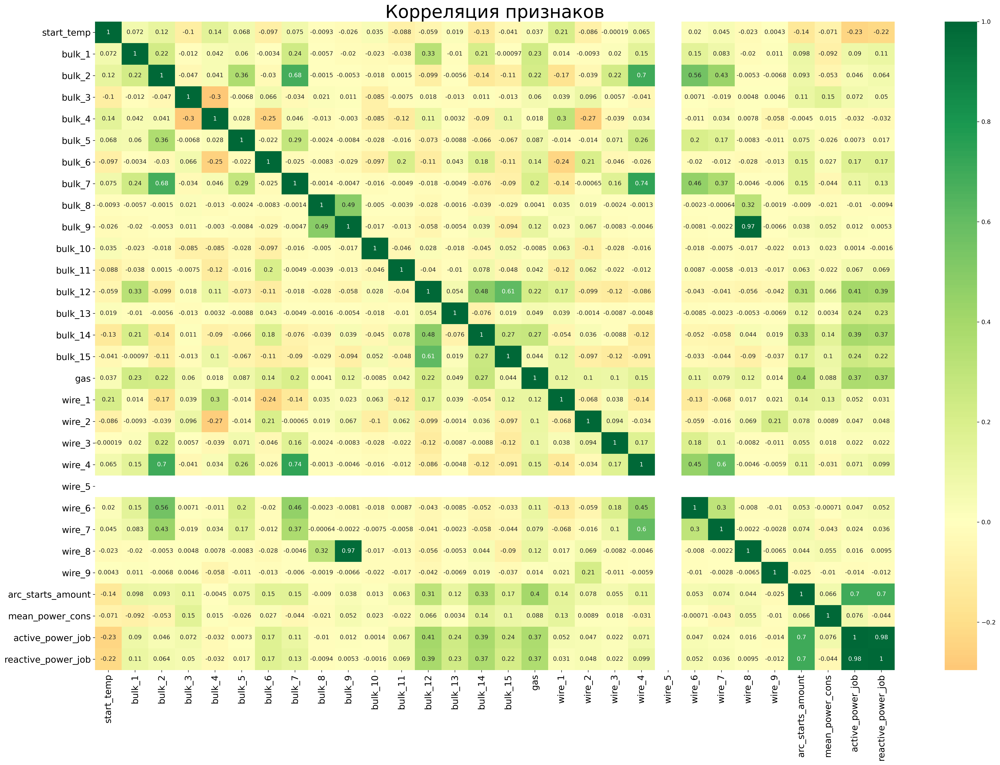

In [147]:
plt.figure(figsize=(30,20), dpi= 300)
sns.heatmap(corr, xticklabels=corr.columns, 
            yticklabels=corr.columns, cmap='RdYlGn', center=0, annot=True)

plt.title('Корреляция признаков', fontsize=30)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

Очень сильная положительная корреляция между активной и реактивной мощностью - оставим только реактивную. Также есть неочевидная, но сильная положительная зависимость между столбцами wire_8 и bulk_9. Чем это вызвано, сложно предположить, но оставлять оба столбца теперь нет смысла. Удалим wire_8 вместе с wire_5 - в последнем, после всех отсевов, просто не осталось данных.

In [148]:
data_model = data_model.drop(['active_power_job', 'wire_5', 'wire_8'], axis = 1)

In [149]:
data_model

,key,final_temp,start_temp,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,...,wire_1,wire_2,wire_3,wire_4,wire_6,wire_7,wire_9,arc_starts_amount,mean_power_cons,reactive_power_job
0,1,1613.0,1571.0,0.0,0.0,0.0,43.0,0.0,0.0,0.0,...,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,5,1.538898,3495.198629
1,2,1602.0,1581.0,0.0,0.0,0.0,73.0,0.0,0.0,0.0,...,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,4,1.551834,1620.468754
2,3,1599.0,1596.0,0.0,0.0,0.0,34.0,0.0,0.0,0.0,...,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,5,1.583120,1047.394762
3,4,1625.0,1601.0,0.0,0.0,0.0,81.0,0.0,0.0,0.0,...,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,4,1.563487,1526.680572
4,5,1602.0,1576.0,0.0,0.0,0.0,78.0,0.0,0.0,0.0,...,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,4,1.480428,1957.546499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2323,2495,1591.0,1570.0,0.0,0.0,21.0,0.0,0.0,0.0,0.0,...,89.150879,0.00000,0.0,0.0,0.0,0.0,0.0,4,1.372734,1706.841484
2324,2496,1591.0,1554.0,0.0,0.0,0.0,63.0,0.0,0.0,0.0,...,114.179527,0.00000,0.0,0.0,0.0,0.0,0.0,6,1.491059,2641.573774
2325,2497,1589.0,1571.0,0.0,0.0,0.0,85.0,0.0,0.0,0.0,...,94.086723,9.04800,0.0,0.0,0.0,0.0,0.0,3,1.192036,1053.371997
2326,2498,1594.0,1591.0,0.0,0.0,90.0,0.0,0.0,0.0,0.0,...,118.110717,0.00000,0.0,0.0,0.0,0.0,0.0,5,1.470072,1766.571119


Разделим массив на features и target. А также на обучающую и валидационную выборку. Добавим train_test_split.

In [150]:
from sklearn.model_selection import train_test_split

In [151]:
features_train, features_valid, target_train, target_valid = train_test_split(
    data_model.drop(['final_temp', 'key'], axis=1), data_model['final_temp'], test_size=0.25, random_state=12345)

Теперь добавим все необходимые нам библиотеки.

In [152]:
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostRegressor
from sklearn.linear_model import LinearRegression
import lightgbm as lgb

Начнем с линейной регрессии.

In [153]:
%%time

model = LinearRegression()
model.fit(features_train, target_train)

CPU times: user 11.2 ms, sys: 5.77 ms, total: 17 ms
Wall time: 26.8 ms


LinearRegression()

In [154]:
%%time

predictions = model.predict(features_valid)
print(mean_absolute_error(target_valid, predictions))

6.9505553380868985
CPU times: user 3.25 ms, sys: 1.15 ms, total: 4.4 ms
Wall time: 7.67 ms


6.95 - не лучший результат. Перейдем к CatBoost и подберем пареметры с помощью GridSearch.

In [155]:
%%time

model_cat = CatBoostRegressor()
 
params = {'iterations': range (100, 500, 100),
              'depth': range (1, 16, 5),
                }
 
grid = GridSearchCV(model_cat, params, cv=5, scoring = 'neg_mean_absolute_error')

grid.fit(features_train, target_train)

grid.best_params_

Learning rate set to 0.238336
0:	learn: 11.0456302	total: 52.1ms	remaining: 5.15s
1:	learn: 10.8944549	total: 52.7ms	remaining: 2.58s
2:	learn: 10.7058120	total: 53.1ms	remaining: 1.72s
3:	learn: 10.5837552	total: 53.6ms	remaining: 1.29s
4:	learn: 10.4879241	total: 54.7ms	remaining: 1.04s
5:	learn: 10.3834498	total: 55.3ms	remaining: 866ms
6:	learn: 10.2409628	total: 55.8ms	remaining: 742ms
7:	learn: 10.1333798	total: 56.3ms	remaining: 648ms
8:	learn: 10.0368822	total: 56.8ms	remaining: 574ms
9:	learn: 9.9743052	total: 57.4ms	remaining: 516ms
10:	learn: 9.9466882	total: 57.9ms	remaining: 469ms
11:	learn: 9.8777907	total: 58.4ms	remaining: 428ms
12:	learn: 9.7923729	total: 61ms	remaining: 408ms
13:	learn: 9.7149264	total: 61.9ms	remaining: 380ms
14:	learn: 9.6433707	total: 62.6ms	remaining: 355ms
15:	learn: 9.5739580	total: 63.1ms	remaining: 332ms
16:	learn: 9.5115833	total: 63.6ms	remaining: 311ms
17:	learn: 9.4498326	total: 64.1ms	remaining: 292ms
18:	learn: 9.3865633	total: 64.6ms	re

{'depth': 6, 'iterations': 200}

In [156]:
%%time

model_cat = CatBoostRegressor(iterations = 400, depth = 6)

model_cat.fit(features_train, target_train, verbose=1)

Learning rate set to 0.086481
0:	learn: 10.7455839	total: 4.72ms	remaining: 1.88s
1:	learn: 10.5139649	total: 7.94ms	remaining: 1.58s
2:	learn: 10.3549037	total: 10.2ms	remaining: 1.34s
3:	learn: 10.1643971	total: 12.3ms	remaining: 1.22s
4:	learn: 10.0123119	total: 16.9ms	remaining: 1.33s
5:	learn: 9.8557471	total: 18.9ms	remaining: 1.24s
6:	learn: 9.7154714	total: 20.9ms	remaining: 1.18s
7:	learn: 9.5517598	total: 23ms	remaining: 1.13s
8:	learn: 9.4096173	total: 25.9ms	remaining: 1.12s
9:	learn: 9.3384672	total: 27.9ms	remaining: 1.09s
10:	learn: 9.2236065	total: 30.7ms	remaining: 1.08s
11:	learn: 9.1279478	total: 32.7ms	remaining: 1.06s
12:	learn: 9.0179597	total: 34.7ms	remaining: 1.03s
13:	learn: 8.9604648	total: 36.8ms	remaining: 1.01s
14:	learn: 8.9063467	total: 39.7ms	remaining: 1.02s
15:	learn: 8.8178889	total: 41.8ms	remaining: 1s
16:	learn: 8.7818332	total: 43.9ms	remaining: 989ms
17:	learn: 8.6987191	total: 45.9ms	remaining: 974ms
18:	learn: 8.6292904	total: 48ms	remaining: 

In [157]:
%%time

probabilities_valid = model_cat.predict(features_valid)
print(mean_absolute_error(target_valid, probabilities_valid))

6.04615152453179
CPU times: user 4.41 ms, sys: 1.89 ms, total: 6.3 ms
Wall time: 6.36 ms


6.04 - очень неплохо. Попробуем оценить важность признаков для этой конкретной модели.

In [158]:
importances_cat = model_cat.feature_importances_

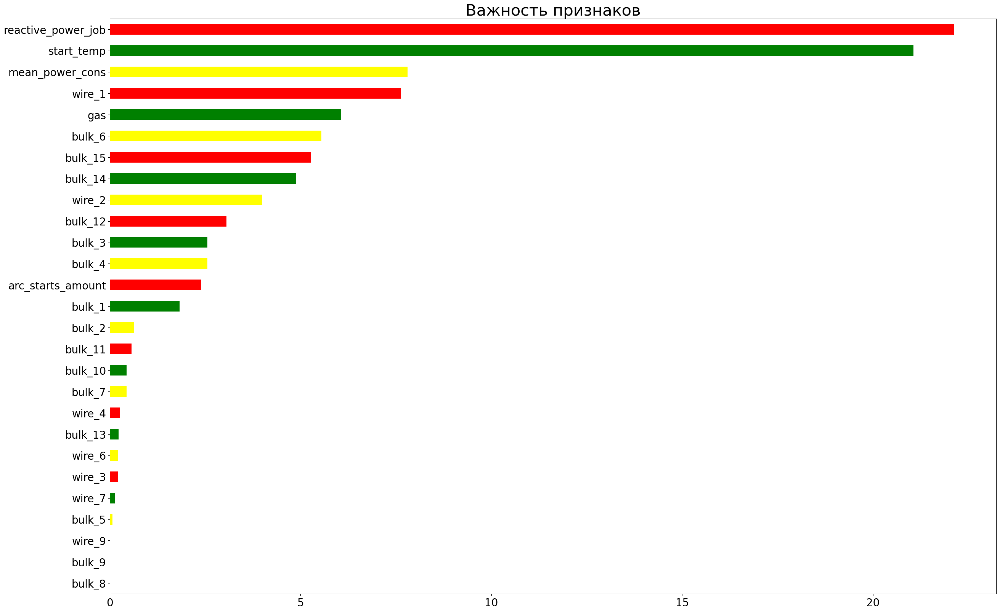

In [159]:
plt.figure(figsize=(30,20), dpi = 100)
feat_importances_cat = pd.Series(model_cat.feature_importances_, index=features_train.columns)
feat_importances_cat.nsmallest(35).plot(kind='barh', color=['yellow', 'green', 'red'])
plt.title('Важность признаков', fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

Попробуем отсеять несколько признаков, не имеющих большой вес - bulk_8, wire_9, bulk_9, bulk_5, wire_3, bulk_10, bulk_13, wire_6, bulk_11.

In [160]:
features_train_cat = features_train.drop(['bulk_8', 'wire_9', 'bulk_9', 
                                          'bulk_5', 'wire_3', 'bulk_10', 
                                          'bulk_13', 'wire_6', 'bulk_11', 
                                          'wire_7', 'wire_4', 'bulk_7',
                                         'bulk_2', 'bulk_3'], axis = 1)
features_valid_cat = features_valid.drop(['bulk_8', 'wire_9', 'bulk_9', 
                                          'bulk_5', 'wire_3', 'bulk_10', 
                                          'bulk_13', 'wire_6', 'bulk_11', 
                                          'wire_7', 'wire_4', 'bulk_7',
                                         'bulk_2', 'bulk_3'], axis = 1)

Попробуем подобрать параметры заново.

In [161]:
%%time

model_cat_1 = CatBoostRegressor()
 
params = {'iterations': range (100, 500, 100),
              'depth': range (1, 16, 5),
                }
 
grid = GridSearchCV(model_cat_1, params, cv=5, scoring = 'neg_mean_absolute_error')

grid.fit(features_train_cat, target_train)

grid.best_params_

Learning rate set to 0.238336
0:	learn: 11.0206622	total: 463us	remaining: 45.9ms
1:	learn: 10.8347021	total: 873us	remaining: 42.8ms
2:	learn: 10.6964054	total: 1.26ms	remaining: 40.8ms
3:	learn: 10.5561794	total: 1.73ms	remaining: 41.6ms
4:	learn: 10.4238435	total: 2.12ms	remaining: 40.3ms
5:	learn: 10.3076759	total: 2.48ms	remaining: 38.9ms
6:	learn: 10.2306741	total: 2.87ms	remaining: 38.1ms
7:	learn: 10.1551521	total: 3.26ms	remaining: 37.5ms
8:	learn: 10.0520414	total: 4.22ms	remaining: 42.7ms
9:	learn: 9.9710559	total: 4.83ms	remaining: 43.5ms
10:	learn: 9.8739415	total: 5.57ms	remaining: 45.1ms
11:	learn: 9.8041841	total: 6.44ms	remaining: 47.2ms
12:	learn: 9.7509421	total: 7.09ms	remaining: 47.5ms
13:	learn: 9.6460209	total: 9.51ms	remaining: 58.4ms
14:	learn: 9.5869518	total: 10.2ms	remaining: 57.6ms
15:	learn: 9.5301140	total: 10.8ms	remaining: 56.9ms
16:	learn: 9.4971467	total: 11.3ms	remaining: 55ms
17:	learn: 9.4118537	total: 11.7ms	remaining: 53.1ms
18:	learn: 9.3610136	

{'depth': 6, 'iterations': 400}

In [162]:
%%time

model_cat_1 = CatBoostRegressor(iterations = 400, depth = 6)

model_cat_1.fit(features_train_cat, target_train, verbose=1)

Learning rate set to 0.086481
0:	learn: 10.7843553	total: 2.72ms	remaining: 1.08s
1:	learn: 10.5665414	total: 4.38ms	remaining: 873ms
2:	learn: 10.3604736	total: 6.06ms	remaining: 802ms
3:	learn: 10.1781142	total: 8.31ms	remaining: 823ms
4:	learn: 10.0306771	total: 10.4ms	remaining: 821ms
5:	learn: 9.8919064	total: 14ms	remaining: 922ms
6:	learn: 9.7545356	total: 18.8ms	remaining: 1.06s
7:	learn: 9.5926262	total: 20.7ms	remaining: 1.01s
8:	learn: 9.4735876	total: 23.3ms	remaining: 1.01s
9:	learn: 9.3402852	total: 25ms	remaining: 973ms
10:	learn: 9.2235864	total: 26.5ms	remaining: 939ms
11:	learn: 9.1083033	total: 32.1ms	remaining: 1.04s
12:	learn: 9.0224005	total: 33.8ms	remaining: 1.01s
13:	learn: 8.9275113	total: 35.7ms	remaining: 984ms
14:	learn: 8.8426413	total: 37.5ms	remaining: 961ms
15:	learn: 8.7943519	total: 39.1ms	remaining: 939ms
16:	learn: 8.7318743	total: 40.9ms	remaining: 922ms
17:	learn: 8.6602990	total: 44.7ms	remaining: 948ms
18:	learn: 8.6034071	total: 47.6ms	remainin

In [163]:
%%time

probabilities_valid_1 = model_cat_1.predict(features_valid_cat)
print(mean_absolute_error(target_valid, probabilities_valid_1))

6.047944800819305
CPU times: user 4.88 ms, sys: 2.02 ms, total: 6.9 ms
Wall time: 14.4 ms


6.04 - по прежнему. Попробуем LGBRegressor и также подберем параметры.

In [164]:
%%time
 
gbm = lgb.LGBMRegressor()

params_lgb = {'n_estimators': range (1, 500, 10),
              'learning_rate': [0.1],
             }
 
grid_lgb = GridSearchCV(gbm, params_lgb, cv=5, scoring = 'neg_mean_absolute_error')

grid_lgb.fit(features_train, target_train)

grid_lgb.best_params_

CPU times: user 3min 12s, sys: 21.2 s, total: 3min 33s
Wall time: 59.3 s


{'learning_rate': 0.1, 'n_estimators': 41}

In [165]:
%%time

gbm = lgb.LGBMRegressor(n_estimators = 41, learnig_rate = 0.1)

gbm.fit(features_train, target_train, eval_set=[(features_valid, target_valid)])

[1]	valid_0's l2: 129.22
[2]	valid_0's l2: 122.435
[3]	valid_0's l2: 116.713
[4]	valid_0's l2: 111.99
[5]	valid_0's l2: 107.757
[6]	valid_0's l2: 104.312
[7]	valid_0's l2: 100.426
[8]	valid_0's l2: 96.8273
[9]	valid_0's l2: 95.0543
[10]	valid_0's l2: 93.0405
[11]	valid_0's l2: 90.9524
[12]	valid_0's l2: 89.0962
[13]	valid_0's l2: 87.5088
[14]	valid_0's l2: 86.3646
[15]	valid_0's l2: 85.0092
[16]	valid_0's l2: 84.0471
[17]	valid_0's l2: 82.7954
[18]	valid_0's l2: 81.6419
[19]	valid_0's l2: 80.8065
[20]	valid_0's l2: 80.0328
[21]	valid_0's l2: 79.4962
[22]	valid_0's l2: 78.541
[23]	valid_0's l2: 78.4296
[24]	valid_0's l2: 78.2974
[25]	valid_0's l2: 77.8573
[26]	valid_0's l2: 77.3191
[27]	valid_0's l2: 76.559
[28]	valid_0's l2: 76.4702
[29]	valid_0's l2: 76.0937
[30]	valid_0's l2: 76.0317
[31]	valid_0's l2: 76.0894
[32]	valid_0's l2: 75.8843
[33]	valid_0's l2: 75.7051
[34]	valid_0's l2: 75.8161
[35]	valid_0's l2: 75.7847
[36]	valid_0's l2: 75.7065
[37]	valid_0's l2: 75.5438
[38]	valid_0's

LGBMRegressor(learnig_rate=0.1, n_estimators=41)

In [166]:
%%time


probabilities_valid_lgb = gbm.predict(features_valid)
print(mean_absolute_error(target_valid, probabilities_valid_lgb))

6.166018716835949
CPU times: user 11 ms, sys: 3.54 ms, total: 14.6 ms
Wall time: 8.9 ms


6.16 - хорошо, но CatBoost лучше. Оценим features.

In [167]:
importances_lgb = gbm.feature_importances_

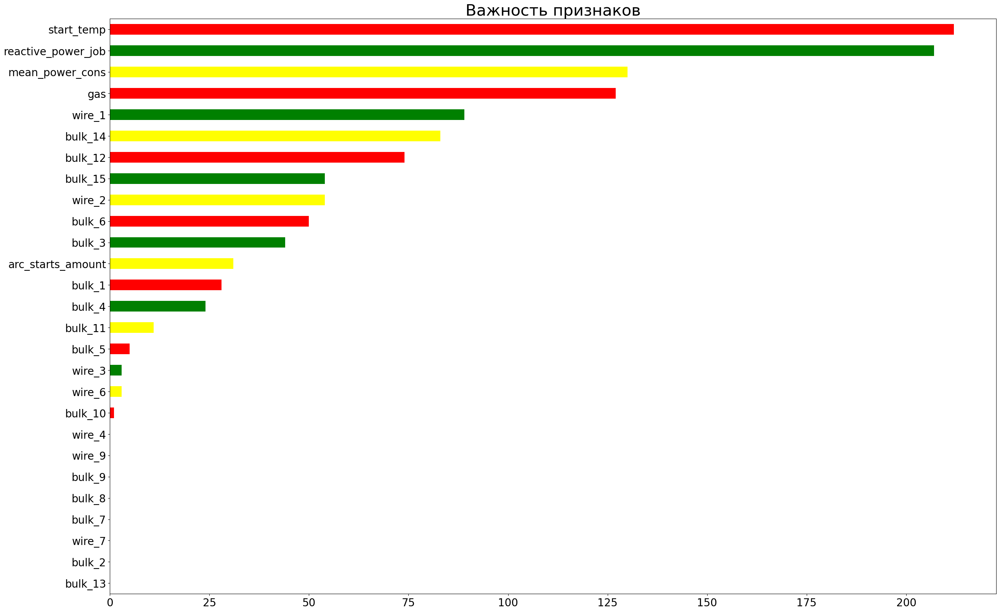

In [168]:
plt.figure(figsize=(30,20), dpi = 100)
feat_importances_lgb = pd.Series(gbm.feature_importances_, index=features_train.columns)
feat_importances_lgb.nsmallest(35).plot(kind='barh', color=['yellow', 'green', 'red'])
plt.title('Важность признаков', fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

Уберем признаки вплоть до bulk_4.

In [169]:
features_train_lgb = features_train.drop(['bulk_8', 'wire_9', 'bulk_9', 
                                          'bulk_5', 'wire_3', 'bulk_10', 
                                          'bulk_13', 'wire_6', 'bulk_11', 
                                          'wire_7', 'wire_4', 'bulk_7',
                                         'bulk_2'], axis = 1)
features_valid_lgb = features_valid.drop(['bulk_8', 'wire_9', 'bulk_9', 
                                          'bulk_5', 'wire_3', 'bulk_10', 
                                          'bulk_13', 'wire_6', 'bulk_11', 
                                          'wire_7', 'wire_4', 'bulk_7',
                                         'bulk_2'], axis = 1)

Проведем подбор и обучение.

In [170]:
%%time
 
gbm_1 = lgb.LGBMRegressor()

params_lgb = {'n_estimators': range (1, 500, 10),
              'learning_rate': [0.1],
             }
 
grid_lgb = GridSearchCV(gbm_1, params_lgb, cv=5, scoring = 'neg_mean_absolute_error')

grid_lgb.fit(features_train_lgb, target_train)

grid_lgb.best_params_

CPU times: user 2min 53s, sys: 16.8 s, total: 3min 9s
Wall time: 52.6 s


{'learning_rate': 0.1, 'n_estimators': 41}

In [171]:
%%time

gbm_1 = lgb.LGBMRegressor(n_estimators = 41, learnig_rate = 0.1)

gbm_1.fit(features_train_lgb, target_train, eval_set=[(features_valid_lgb, target_valid)])

[1]	valid_0's l2: 129.22
[2]	valid_0's l2: 122.435
[3]	valid_0's l2: 116.713
[4]	valid_0's l2: 111.99
[5]	valid_0's l2: 107.757
[6]	valid_0's l2: 104.312
[7]	valid_0's l2: 100.426
[8]	valid_0's l2: 96.8273
[9]	valid_0's l2: 95.0543
[10]	valid_0's l2: 93.0405
[11]	valid_0's l2: 90.9524
[12]	valid_0's l2: 89.0962
[13]	valid_0's l2: 87.5088
[14]	valid_0's l2: 86.3646
[15]	valid_0's l2: 85.0092
[16]	valid_0's l2: 84.0471
[17]	valid_0's l2: 82.7954
[18]	valid_0's l2: 81.6419
[19]	valid_0's l2: 80.8733
[20]	valid_0's l2: 80.3514
[21]	valid_0's l2: 79.9746
[22]	valid_0's l2: 79.452
[23]	valid_0's l2: 78.7428
[24]	valid_0's l2: 78.1853
[25]	valid_0's l2: 77.7191
[26]	valid_0's l2: 77.0365
[27]	valid_0's l2: 77.3521
[28]	valid_0's l2: 77.1954
[29]	valid_0's l2: 76.8013
[30]	valid_0's l2: 76.426
[31]	valid_0's l2: 76.302
[32]	valid_0's l2: 76.0979
[33]	valid_0's l2: 75.9493
[34]	valid_0's l2: 76.062
[35]	valid_0's l2: 75.9005
[36]	valid_0's l2: 75.5344
[37]	valid_0's l2: 75.3364
[38]	valid_0's l

LGBMRegressor(learnig_rate=0.1, n_estimators=41)

In [172]:
%%time


probabilities_valid_lgb_1 = gbm_1.predict(features_valid_lgb)
print(mean_absolute_error(target_valid, probabilities_valid_lgb_1))

6.175167624171009
CPU times: user 8.32 ms, sys: 2.65 ms, total: 11 ms
Wall time: 14.5 ms


6.17, качество ухудщшилось. Вероятно убрали лишнее. Вернем часть массива и попробуем заново.

In [173]:
features_train_lgb_2 = features_train.drop(['bulk_8', 'wire_9', 'bulk_9', 
                                        'bulk_13', 'wire_7', 'wire_4', 
                                        'bulk_7', 'bulk_2'], axis = 1)
features_valid_lgb_2 = features_valid.drop(['bulk_8', 'wire_9', 'bulk_9', 
                                        'bulk_13', 'wire_7', 'wire_4', 
                                        'bulk_7', 'bulk_2'], axis = 1)

In [174]:
%%time
 
gbm_2 = lgb.LGBMRegressor()

params_lgb = {'n_estimators': range (1, 500, 10),
              'learning_rate': [0.1],
             }
 
grid_lgb = GridSearchCV(gbm_2, params_lgb, cv=5, scoring = 'neg_mean_absolute_error')

grid_lgb.fit(features_train_lgb_2, target_train)

grid_lgb.best_params_

CPU times: user 3min 4s, sys: 19 s, total: 3min 23s
Wall time: 56.7 s


{'learning_rate': 0.1, 'n_estimators': 41}

In [175]:
%%time

gbm_2 = lgb.LGBMRegressor(n_estimators = 41, learnig_rate = 0.1)

gbm_2.fit(features_train_lgb_2, target_train, eval_set=[(features_valid_lgb_2, target_valid)])

[1]	valid_0's l2: 129.22
[2]	valid_0's l2: 122.435
[3]	valid_0's l2: 116.713
[4]	valid_0's l2: 111.99
[5]	valid_0's l2: 107.757
[6]	valid_0's l2: 104.312
[7]	valid_0's l2: 100.426
[8]	valid_0's l2: 96.8273
[9]	valid_0's l2: 95.0543
[10]	valid_0's l2: 93.0405
[11]	valid_0's l2: 90.9524
[12]	valid_0's l2: 89.0962
[13]	valid_0's l2: 87.5088
[14]	valid_0's l2: 86.3646
[15]	valid_0's l2: 85.0092
[16]	valid_0's l2: 84.0471
[17]	valid_0's l2: 82.7954
[18]	valid_0's l2: 81.6419
[19]	valid_0's l2: 80.8065
[20]	valid_0's l2: 80.0328
[21]	valid_0's l2: 79.4962
[22]	valid_0's l2: 78.541
[23]	valid_0's l2: 78.4296
[24]	valid_0's l2: 78.2974
[25]	valid_0's l2: 77.8573
[26]	valid_0's l2: 77.3191
[27]	valid_0's l2: 76.559
[28]	valid_0's l2: 76.4702
[29]	valid_0's l2: 76.0937
[30]	valid_0's l2: 76.0317
[31]	valid_0's l2: 76.0894
[32]	valid_0's l2: 75.8843
[33]	valid_0's l2: 75.7051
[34]	valid_0's l2: 75.8161
[35]	valid_0's l2: 75.7847
[36]	valid_0's l2: 75.7065
[37]	valid_0's l2: 75.5438
[38]	valid_0's

LGBMRegressor(learnig_rate=0.1, n_estimators=41)

In [176]:
%%time


probabilities_valid_lgb_2 = gbm_2.predict(features_valid_lgb_2)
print(mean_absolute_error(target_valid, probabilities_valid_lgb_2))

6.166018716835949
CPU times: user 8.66 ms, sys: 3.93 ms, total: 12.6 ms
Wall time: 17.7 ms


6.16 - вернулись к исходному результату, но зато сокращено время подбора и обучения. Будем добивать CatBoost до показателей ниже 6.

In [177]:
%%time

model_cat_1 = CatBoostRegressor()
 
params = {'iterations': range (600, 700, 3),
              'depth': range (6, 7, 1),
                }
 
grid = GridSearchCV(model_cat_1, params, cv=5, scoring = 'neg_mean_absolute_error')

grid.fit(features_train_cat, target_train)

grid.best_params_

Learning rate set to 0.061065
0:	learn: 10.9824847	total: 6.52ms	remaining: 3.9s
1:	learn: 10.8126954	total: 11.8ms	remaining: 3.51s
2:	learn: 10.6578818	total: 14.5ms	remaining: 2.88s
3:	learn: 10.5012385	total: 17.2ms	remaining: 2.56s
4:	learn: 10.3529151	total: 24.3ms	remaining: 2.88s
5:	learn: 10.2303154	total: 29.6ms	remaining: 2.93s
6:	learn: 10.1012052	total: 31.7ms	remaining: 2.69s
7:	learn: 9.9790668	total: 33.8ms	remaining: 2.5s
8:	learn: 9.8454314	total: 35.9ms	remaining: 2.36s
9:	learn: 9.7275702	total: 38.7ms	remaining: 2.29s
10:	learn: 9.6289930	total: 41.6ms	remaining: 2.23s
11:	learn: 9.5454245	total: 45.3ms	remaining: 2.22s
12:	learn: 9.4655161	total: 48.3ms	remaining: 2.18s
13:	learn: 9.3832494	total: 51.9ms	remaining: 2.17s
14:	learn: 9.3146763	total: 54.3ms	remaining: 2.12s
15:	learn: 9.2623607	total: 57ms	remaining: 2.08s
16:	learn: 9.2025234	total: 60.5ms	remaining: 2.07s
17:	learn: 9.1264954	total: 62.6ms	remaining: 2.02s
18:	learn: 9.0677673	total: 65.8ms	remain

{'depth': 6, 'iterations': 609}

In [178]:
%%time

model_cat_1 = CatBoostRegressor(iterations = 690, depth = 6)

model_cat_1.fit(features_train_cat, target_train, verbose=1)

Learning rate set to 0.057143
0:	learn: 10.8593574	total: 1.91ms	remaining: 1.31s
1:	learn: 10.7101280	total: 6.2ms	remaining: 2.13s
2:	learn: 10.5748551	total: 8.53ms	remaining: 1.95s
3:	learn: 10.4345267	total: 10.7ms	remaining: 1.84s
4:	learn: 10.3025545	total: 13.2ms	remaining: 1.81s
5:	learn: 10.1929856	total: 15.5ms	remaining: 1.77s
6:	learn: 10.0607369	total: 17.9ms	remaining: 1.75s
7:	learn: 9.9549351	total: 19.9ms	remaining: 1.7s
8:	learn: 9.8395625	total: 21.8ms	remaining: 1.65s
9:	learn: 9.7328893	total: 23.5ms	remaining: 1.6s
10:	learn: 9.6453794	total: 25.4ms	remaining: 1.57s
11:	learn: 9.5830061	total: 27.3ms	remaining: 1.54s
12:	learn: 9.5070741	total: 29.1ms	remaining: 1.52s
13:	learn: 9.4255927	total: 30.9ms	remaining: 1.49s
14:	learn: 9.3478869	total: 32.9ms	remaining: 1.48s
15:	learn: 9.2840063	total: 34.6ms	remaining: 1.46s
16:	learn: 9.2120643	total: 36.3ms	remaining: 1.44s
17:	learn: 9.1577233	total: 38.2ms	remaining: 1.42s
18:	learn: 9.0985815	total: 40ms	remaini

In [179]:
%%time

probabilities_valid_1 = model_cat_1.predict(features_valid_cat)
print(mean_absolute_error(target_valid, probabilities_valid_1))

5.989112382562141
CPU times: user 3.82 ms, sys: 1.71 ms, total: 5.53 ms
Wall time: 3.45 ms


5.98 - показатель достигнут!

## 4. Итоговый отчет по работе.

Нашей задачей было построить наиболее качественную модель прогнозирования финальной температуры сплава с целью снизить общее энергопотребление. 
В процессе решения этой задачи мы выполнили большое количество промежуточных. Разберем все этапы работы.

### 1. Обработка данных.
    Нам требовалось загрузить каждый массив, проверить его, обработать - в общем, подготовить к анализу.
    Помимо стандартной работы по замене типов данных и заполнению пропусков, стоит отметить несколько пунктов: 
    - один аномальный выброс в -715 в таблице data-arc, значение реактивной мощности в партии 2116. Из-за него мы удалили эту партию целиком из всех таблиц.
    - серьезная редакция таблицы data_temp. Так как показатель начальной температуры это признак, а показатель финальной температуры это ключевой признак, то мы не имели права как-то пытаться воссоздать пропуски. Поэтому нам пришлось удалить все партии с отсутствующими значениями (если есть промежуточные пропуски, значит могут быть и ошибки в имеющихся замерах этой партии), а также удалить партии с единственным замером температуры (признак сравнивается с ключевым признаком, это недопустимо). На основе этой таблицы мы создали реестр хороших партий (2474 штуки) и отфильтровали по нему все таблицы. 
    - но после фильтрации таблиц data_bulk и data_bulk_time мы обнаружили, что число партий в таблицах отличается. Мы пришли к выводу, что критерии фильтрации таблиц при обработке разные, число партий в них получается разное, поэтому нам потребовалось сначала провести обработку всех остальных массивов, создать итоговый реестр хороших партий и уже по нему провести фильрацию всех таблиц (2328 партий). После этого мы были готовы к решению поставленных задач.
    

### 2. Промежуточные задачи.

    a) Для каждой партии найти длительность времени между первым и последним замером температуры.
    Все прошло согласно плану. Цикл помог нам посчитать требуемую дельту. Результат вместе с номером партии отправился в таблицу data_new.
    
    b) Для каждой партии найти суммарное время нагрева электродами, то есть сумму значений по всем промежуткам между запусками нагрева электродов.
    Сначала посчитали время каждого нагрева, а потом с помощью pivot_table просуммировали все по партиям и добавили в таблицу data_new.
    
    c) Для каждой партии найти количество запусков нагрева электродами.
    Также с помощью pivot_table мы посчитали количество запусков по каждоу партии и добавили в таблицу data_new.
    
    d) Для каждой партии найти среднее соотношение потребления активной и реактивной мощности.
    Добавили в таблицу data_arc соотношение мощностей и через pivot_table посчитали среднее соотношение по партиям, также добавив информацию в таблицу data_new.
    
    e) По всем полученным столбцам вычислите статистики: средние, минимальные и максимальные значения, медиану и величины 25%- и 75%-квартилей.
    Тут мы отошли немного от первоначального плана. Просто применили метод describe к таблице data_new. Там мы увидели, что есть немного удивительная максимальная длительность времени между замерами температуры - 6 с половиной часов против среднего в 31 минуту. Но, посмотрев на выборку из 30 максимальных значений длительности времени между замерами темпераутры, мы пришли к выводу, что это скорее особенность технологического процесса и без комментария заказчика принимать это за выброс мы не можем.
    После этого мы перешли к главной задаче исследования.
    

### 3. Главная задача.

    Предсказать финальную температуру в процессе выплавления, чтобы не перегревать сталь и не расходовать излишнее электричество.
    
    В первую очередь нам требовалось агрегировать нужные для исследования данные в таблицу data_model. Отдельно мы посчитали работу, затрачиваемую на нагрев электродов - активную и реактивную. 
    
    Заменив названия столбцов на более универсальные для моделей, мы перешли к диаграмме корреляции признаков. На ней мы обнаружили, что существует очень сильная положительная корреляция между активной и реактивной мощностью - оставили только реактивную. Также есть неочевидная, но сильная положительная зависимость между столбцами wire_8 и bulk_9. Чем это вызвано, сложно предположить, но оставлять оба столбца не было смысла. Удалили wire_8 вместе с wire_5 - в последнем, после всех отсевов, просто не осталось данных.
    
    Далее мы разделили выборку на обучающую и валидационную, а также на признаки и ключевой признак.
    
    Обучение начали с модели линейной регрессии. Она показала неплохой результат МАЕ в 6.95.
    
    После этого мы перешли к бустингу CatBoostRegressor. С помощью Gridsearch мы попробовали подобрать лучшие параметры количества итераций и глубины изучения. Лучшей оказалась комбинация 400:6 с МАЕ равным 6.10. Хороший показатель, но мы пошли дальше. Благодаря методу feature_importances мы обнаружили, что несколько признаков имеют крайне малое влияние на модель. Поэтому мы избавились от них и провели подбор и обучение заново. Найти параметры лучше не получилось, но зато мы ускорили процесс подбора/обучения и получили МАЕ 6.08.
    
    Настало время попробовать LGBMRegressor. Также с помощью GridSearch мы получили модель с МАЕ 6.16. После оценки признаков мы сначала немного ухудшили модель, удалив лишние признаки, но, вернув их часть обратно, мы добились улучшения только в скорости подбора и обучения - МАЕ не уменьшился.
    
    Поэтому мы вернулись к CatBoost и, заменив интервалы поиска GridSearch, получили модель с количеством итерации 690 и глубиной 6, которая дала нам столь ожидаемый МАЕ в 5.98.


### Вывод.

    С поставленной задачей мы справились. Подготовили данные, провели анализ и построили модель CatBoostRegressor с параметрами iterations = 690 и depth = 6, которая дала нам требуемый показатель МАЕ в 5.98.
    Благодаря этому, заказчик имеет возможность предсказывать финальную температуру обработки стали, планировать и оптимизировать энергопотребление.

    Помимо этого мы бы могли рекомендовать заказчику следующее:

1. Обратить внимание на процесс замера темпераутр. Массив с этими данными оказался самым неподготовленным и с наибольшими ошбиками. Проведя проверку и настройку этих систем, можно улучшить экономию ресурсов как за счет повышения качества прогнозирования, так и засчет исключения переработки или недоработки любого из циклов сталеварения. Каждый новый цикл ведет за собой финансовые издержки.

2. Исследовать связь между wire_8 и bulk_9. Слишком сильная корреляция для двух никак не связанных, в теории, процессов. Возможно проводиться излишняя обработка.

3. Проверить датчики, фиксирующие активную и реактивную мощность. Один экстремальный выброс в партии 2116 сигнализирует о неполадке в этом процессе.

    Помимо рекомендаций мы бы хотели предложить заказчику свои дальнейшие услуги. Имея больший доступ к данным, а также к построению этапов производства и бизнес-процессов, мы бы получили возможность дать заказчику максимальную экономическую выгоду.

Спасибо за внимание.